In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sigmaclip as sigmaclip
from scipy.interpolate import interp1d
import astropy.constants as const
from scipy.optimize import curve_fit
import pandas as pd

from function import med_n_lim

import warnings
warnings.filterwarnings('ignore')

In [2]:
# reading SYSREM residuals

# number of order, frame, wavelength, and SysRem iteration (all refer to data after passing SysRem)
numorder, numframe, numwv, n_sys = 22, 56, 4080, 10

#for propagation error
flux_data = np.zeros((numorder,n_sys+1,numframe,numwv))
error_data = flux_data.copy()
wave_data = flux_data.copy()
a_data = np.zeros((numorder,n_sys+1,numframe))
c_data = np.zeros((numorder,n_sys+1,numwv))

for order in range(numorder):
    for sysiter in range(n_sys+1):

    #reading hdf5 file for each SYSREM iteration (default binmedfil=151)
        with h5py.File('data/hdf5/HD149026b-after-#'+str(sysiter)+'-SYSREM-iteration-sys-MJD_to_BJD.hdf5', 'r') as h5f_raw:

            flux_data[order,sysiter] = h5f_raw['flux-order-'+str(order)][()]
            error_data[order,sysiter] = h5f_raw['error-poisson-order-'+str(order)][()]
            wave_data[order,sysiter] = h5f_raw['wv-vac-order-'+str(order)][()]
            airmass = h5f_raw['airmass'][()]
            rvcor = h5f_raw['rv_cor'][()]
            bjd = h5f_raw['bjd'][()]
            jd = h5f_raw['jd'][()]
            phase = h5f_raw['phase'][()]
            rel_phase = h5f_raw['rel_phase'][()]
            hour_phase = h5f_raw['hour_phase'][()]
            exptime = h5f_raw['exp_time'][()]
            out_transit_mask = h5f_raw['out_transit_mask'][()]
            transit_weight = h5f_raw['transit_weight'][()]
            carm_order = h5f_raw['carm_order'][()]
            contact_index = h5f_raw['contact_index'][()]

            if sysiter != 0:
                a_data[order,sysiter-1] = h5f_raw['a-coeff-order-'+str(order)][()]
                c_data[order,sysiter-1] = h5f_raw['c-coeff-order-'+str(order)][()]

In [3]:
# telluric model path
tel_model_path = 'data/hdf5/telluric-transmission-model-spectrum-80400-accurate.hdf5' # in vacuum

with h5py.File(tel_model_path, 'r') as h5f_raw:
            modflux_tel = h5f_raw['flux'][()]
            modwave_tel = h5f_raw['wv'][()]

In [4]:
def kpvsys_calc(Kp, Vsys, RV, data, vsys_planet, orb_phase, RV_bary, mask):

    """
    Interpolate CCF values to a range of Kp and Vsys

    Args:
        kp          : K_p sample in km/s
        vsys        : V_sys sample in km/s
        drvs        : RV sample in km/s
        data        : Cross-correlation values to be interpolated (frame x RV)
        vsys_planet : The expected V_sys of the planet
        orb_phase   : Orbital phase of the planet
        brv         : Correction for barycentric velocity
        mask        : A mask for out-transit frames

    Return:
        summed      : Interpolated CCF values
    """

    kpvsys_frame = np.zeros([Kp.size] + [data.shape[0]] + [Vsys.size])
    for kp_idx,kp in enumerate(Kp):

        # aligning the in-trail CCF to the planetary rest-frame (Vsys ~ 0 km/s)
        RV_predict = kp * np.sin(2. * np.pi * orb_phase)

        for phase_idx in range(orb_phase.size):
            kpvsys_frame[kp_idx,phase_idx] = interp1d(RV,data[phase_idx],kind='linear')(RV_predict[phase_idx] + Vsys)

    kpvsys_map = kpvsys_frame.sum(axis=1)
    return kpvsys_map

def fitting_histogram(distribution,plot=True):

    # making the histogram
    num_bins = int(1 + 3.322*np.log10(len(distribution))) # following Sturge's rule
    hist_ = plt.hist(distribution,histtype="step",align='mid',bins=num_bins)

    # assigning the value of each bin and the x-axis of the bin itself ~ (right_edge+left_edge)/2
    x_hist_edges,y_hist = hist_[1],hist_[0]
    x_hist = (x_hist_edges[:-1] + x_hist_edges[1:])/2

    # calculating the Gaussian PDF values given Gaussian parameters and random variable X
    def gaus(X, C, X_mean, sigma):
        return C * np.exp(-(X - X_mean)**2 / (2 * sigma**2))
    
    # calculate the mean and standard deviation
    # the standard deviation is the square root of the variance of the distribution, which is defined as the average of the squared differences of the data from the mean.
    mean = sum(x_hist * y_hist) / sum(y_hist)
    sigma = sum(y_hist * (x_hist-mean)**2) / sum(y_hist)

    # Gaussian least-square fitting process
    # the constant C is just a normalization factor, so we can use the maximum value of the distribution
    param_optimised,param_covariance_matrix = curve_fit(gaus,x_hist,y_hist,p0=[max(y_hist),mean,sigma],maxfev=5000)

    # plotting the histogram
    if plot:
        plt.hist(distribution,histtype="step",align='mid',bins=num_bins)
        plt.plot(x_hist,y_hist,label='data')
        plt.plot(x_hist,gaus(x_hist,*param_optimised),label='fit')
        plt.legend()
        plt.show()
        plt.clf()

    # print fit Gaussian parameters
    print("Fit parameters: ")
    print("=====================================================")
    print("C = ", param_optimised[0], "+-", np.sqrt(param_covariance_matrix[0, 0]))
    print("X_mean =", param_optimised[1], "+-", np.sqrt(param_covariance_matrix[1, 1]))
    print("sigma = ", param_optimised[2], "+-", np.sqrt(param_covariance_matrix[2, 2]))
    print("\n")

    return np.abs(param_optimised[2])

In [5]:
# function for cross-correlating model with data, creating Kp-Vsys map, and calculating log-likelihood  mapping
def detect_molecules(wavedat, fluxdat, errordat, wave_modelmol, flux_modelmol,
                     sysrem_iteration, carm_order,
                     RV_sample, Kp_sample, Vsys_sample, A_sample,
                     Kp_planet, Vsys_planet,
                     out_transit_mask, rvcor, phase,
                     std_brogi=True, plot=True, 
                     thold_kp=200, thold_vsys=80, dpi=100):

    CC_total_norm_final = []
    SN_map_final = []
    Likelihood_F_final = []
    for sys_iter in range(sysrem_iteration):

        if sys_iter != 20:

            # print('################ SYSREM '+str(sys_iter)+' #####################')
            
            K1_all,K2_all,CC_all,N_data = [],[],[],[]
            for idx in range(len(carm_order)):

                flux_obs = fluxdat[idx][sys_iter].copy()
                wave_obs = wavedat[idx][sys_iter].copy()
                error_obs = errordat[idx][sys_iter].copy()

                # masking model to the corresponding order wavelength
                masktemp = (wave_modelmol > wave_obs[0][0] - 20) * (wave_modelmol < wave_obs[0][-1] + 20)
                wave_mod,flux_mod = wave_modelmol[masktemp],flux_modelmol[masktemp]

                # Doppler-shift the model (RV_sample x wavelength)
                wave_mod_shifted = wave_obs[0][np.newaxis,:] / (1 + RV_sample*1000/const.c.value)[:,np.newaxis]
                flux_mod_shifted = np.interp(wave_mod_shifted,wave_mod,flux_mod)

                # putting the Doppler-shifted model into common continuum level
                flux_mod_shifted -= np.nanmedian(flux_mod_shifted,axis=1)[:,np.newaxis]
                maskpix = error_obs[0]!=np.inf
                for frame in range(error_obs.shape[0]):
                    flux_obs[frame][maskpix==True] = flux_obs[frame][maskpix] - np.nanmedian(flux_obs[frame][maskpix])

                # calculating the summation terms in the chi^2 equation
                K1 = np.nansum(flux_obs**2/error_obs**2,axis=1)
                K2 = np.dot(1./error_obs**2,(flux_mod_shifted**2).T)
                CC = np.dot(flux_obs/error_obs**2,flux_mod_shifted.T)

                K1_all.append(K1)
                K2_all.append(K2)
                CC_all.append(CC)
                N_data.append(len(wave_obs[0]))

            # summing over orders
            K1_total = np.sum(K1_all,axis=0)
            K2_total = np.sum(K2_all,axis=0)
            CC_total = np.sum(CC_all,axis=0)
            Ndata_total = np.sum(N_data)

            # normalizing
            CC_total_norm = CC_total - np.nanmedian(CC_total,axis=1)[:,np.newaxis]

            CC_total_flip = CC_total_norm.copy()
            for i in range(len(CC_total_norm)):
                if CC_total_norm[i][np.argmax(np.abs(CC_total_norm[i]))] < 0:
                    CC_total_flip[i] = CC_total_norm[i] * (-1)
            
            CC_combine = np.sum(CC_total_flip, axis=0)
            CC_total_norm_final.append(CC_total_norm)

            # note: transit_weight acts like scale factor on the chi^2 computation (K1 not weighted, K2 weighted by squared)*transit_weight[:,np.newaxis]
            # note: barycentric RV should be given in negative due to the signing adoption of CARMENES pipeline (see e.g., Webb+ 2022)
            CC_all_kpvsys = kpvsys_calc(Kp_sample,Vsys_sample,RV_sample,CC_total\
                            ,Vsys_planet,np.array(phase),np.zeros((len(rvcor))),out_transit_mask!=np.inf)
            K2_all_kpvsys = kpvsys_calc(Kp_sample,Vsys_sample,RV_sample,K2_total\
                            ,Vsys_planet,np.array(phase),np.zeros((len(rvcor))),out_transit_mask!=np.inf)
            K1_all_kpvsys = K1_total[out_transit_mask!=np.inf].sum()
            Ndata_total *= len(out_transit_mask[out_transit_mask!=np.inf]) # multiply by the number of in-transit frames

            # index of the location of the expected telluric location
            vsys_expect = (np.abs(Vsys_sample - Vsys_planet)).argmin()
            kp_expect = (np.abs(Kp_sample - Kp_planet)).argmin()

            ################################## Kp-Vsys Map ##################################

            # CC for Kp-Vsys map (must be normalised)
            CC_all_kpvsys_norm = kpvsys_calc(Kp_sample,Vsys_sample,RV_sample,CC_total_flip,Vsys_planet,np.array(phase),-np.array(rvcor),out_transit_mask!=np.inf)
            
            # index of maximum value in the Kp-Vsys map
            kp_snmax,vsys_snmax = kp_expect, vsys_expect # np.unravel_index(CC_all_kpvsys_norm.argmax(),CC_all_kpvsys_norm.shape)

            # masking the maximum signal in the map (+-thold)
            masked_peak = CC_all_kpvsys_norm != np.inf
            kp_maskpeak = np.digitize([Kp_sample[kp_snmax] - thold_kp, Kp_sample[kp_snmax] + thold_kp], Kp_sample)
            vsys_maskpeak = np.digitize([Vsys_sample[vsys_snmax] - thold_vsys, Vsys_sample[vsys_snmax] + thold_vsys], Vsys_sample)
            masked_peak[kp_maskpeak[0]:kp_maskpeak[-1],vsys_maskpeak[0]:vsys_maskpeak[-1]] = False

            # masking telluric region Kp ~ 0-50 km/s for all Vrest
            kp_tel = (np.abs(Kp_sample - 50)).argmin()
            masked_peak[:kp_tel,:] = False
            
            # choosing between using std calculation from Brogi or the conventional
            if not std_brogi:
                # map_std = kpvsys_sigma_conventional(CC_all_kpvsys_norm,Kp_sample,Vsys_sample,kp_snmax,vsys_snmax,kp_negative)
                map_std = np.std(CC_all_kpvsys_norm[masked_peak])
            else:
                map_std = fitting_histogram(CC_all_kpvsys_norm[masked_peak],plot=plot)

            SN_map = CC_all_kpvsys_norm / map_std
            SN_map_final.append(SN_map)

            # ################################## Likelihood Computation ##################################

            # compute chi^2
            chi2_total = K1_all_kpvsys + A_sample[:,np.newaxis,np.newaxis]**2. * K2_all_kpvsys[np.newaxis,...] -\
                        2. * A_sample[:,np.newaxis,np.newaxis] * CC_all_kpvsys[np.newaxis,...]

            # compute likelihood
            logL = -Ndata_total / 2 * np.log(chi2_total / Ndata_total)
            Likelihood_F = np.exp(logL-np.max(logL))

            Likelihood_F_final.append(Likelihood_F)

            # marginilising Kp, Vsys, and alpha
            Kp_marg = Likelihood_F.sum(axis=(0,2)) #for Kp
            Vsys_marg = Likelihood_F.sum(axis=(0,1)) #for Vsys
            A_marg = Likelihood_F.sum(axis=(1,2)) #for alpha
            
            # compute the median and 1-sigma value of the posterior and corresponding parameter value
            std_A_low,med_A,std_A_high = med_n_lim(A_sample,A_marg)
            std_vsys_low,med_vsys,std_vsys_high = med_n_lim(Vsys_sample,Vsys_marg)
            std_kp_low,med_kp,std_kp_high = med_n_lim(Kp_sample,Kp_marg)

            # conditional likelihood at maximum signal
            A_cond = Likelihood_F[:,np.argmax(Kp_marg),np.argmax(Vsys_marg)]
            std_Ac_low,med_Ac,std_Ac_high = med_n_lim(A_sample,A_cond)

            colorm = 'viridis'
            cmap = plt.get_cmap(colorm)
            cmap.set_bad(color = 'white', alpha = 1.)
            
            ################################### CC map ################################### 

            axes_rvmap = [0, 0, 0.4, 0.6]
            # axes_vsysmap = [0 + 0.4, 0, 0.3, 0.6]
            axes_cccombcurve = [0 + 0.4 + 0.02, 0, 0.2, 0.6]

            fig = plt.figure(figsize=(10, 4),dpi=dpi)
            rvmap = plt.axes(axes_rvmap)
            # vsysmap = plt.axes(axes_vsysmap)
            cccombcurve = plt.axes(axes_cccombcurve)

            frames = rel_phase  #np.arange(len(rel_phase))

            rvmap.pcolormesh(RV_sample, frames, CC_total_norm, cmap=cmap)
            rvmap.set_ylabel("Frame number")
            rvmap.set_xlabel("RV (km/s)")
            rvmap.plot((0, 0), (frames[0], frames[contact_index[0]]), ls='--', color='red', alpha=1, lw=1)
            rvmap.plot((0, 0), (frames[-1], frames[contact_index[3]]), ls='--', color='red', alpha=1, lw=1)
            rvmap.axhline(y=frames[contact_index[0]], c="white", lw=1, alpha=1, ls="--")
            rvmap.axhline(y=frames[contact_index[1]], c="white", lw=1, alpha=1, ls="--")
            rvmap.axhline(y=frames[contact_index[2]], c="white", lw=1, alpha=1, ls="--")
            rvmap.axhline(y=frames[contact_index[3]], c="white", lw=1, alpha=1, ls="--")
            #rvmap.plot(rvp_min,frames,lw=1,ls='--',alpha=0.8,c='white')
            #rvmap.plot(rvp_max,frames,lw=1,ls='--',alpha=0.8,c='white')

            cccombcurve.plot(RV_sample, CC_combine)
            cccombcurve.axvline(x=0, ls="--", alpha=0.5)
            cccombcurve.set_xlabel("V$_{sys,rest}$ (km/s)")
            cccombcurve.yaxis.set_ticks_position('right')
            cccombcurve.yaxis.set_label_position("right")
            cccombcurve.set_ylabel('Combined in-transit normalised CCF values', rotation=270, labelpad=14)
            cccombcurve.set_title("#" + str(sys_iter) + " SYSREM")

            plt.show(block=False)
            plt.clf()

            ################################### Kp-Vsys map ################################### 

            def kpvsys_plot(kpvsys,label,vmax=vsys_snmax,kmax=kp_snmax,shade=False):

                axes_kpvsysmap = [0, 0, 0.5, 0.5]
                axes_vsyscurve = [0, 0 + 0.5, 0.5, 0.2]
                axes_kpcurve = [0 + 0.5, 0, 0.2, 0.5]

                fig = plt.figure(figsize=(7, 6))
                kpvsysmap = plt.axes(axes_kpvsysmap)
                kpcurve = plt.axes(axes_kpcurve)
                vsyscurve = plt.axes(axes_vsyscurve)

                SN_mapcolorbar = kpvsysmap.pcolormesh(Vsys_sample, Kp_sample, kpvsys, cmap=cmap)
                kpvsysmap.set_xlabel("V$_{sys}$ (km/s)")
                kpvsysmap.set_ylabel("K$_{p}$ (km/s)")
                gap = 30
                # vertical lines
                kpvsysmap.plot((Vsys_sample[vmax], Vsys_sample[vmax]), (Kp_sample[0], Kp_sample[kmax] - gap), ls='--',
                            color='white', alpha=1, lw=1)
                kpvsysmap.plot((Vsys_sample[vmax], Vsys_sample[vmax]), (Kp_sample[-1], Kp_sample[kmax] + gap), ls='--',
                            color='white', alpha=1, lw=1)
                # horizontal lines
                kpvsysmap.plot((Vsys_sample[0], Vsys_sample[vmax] - gap), (Kp_sample[kmax], Kp_sample[kmax]), ls='--',
                            color='white', alpha=1, lw=1)
                kpvsysmap.plot((Vsys_sample[-1], Vsys_sample[vmax] + gap), (Kp_sample[kmax], Kp_sample[kmax]), ls='--',
                            color='white', alpha=1, lw=1)
                kpvsysmap.plot(Vsys_sample[vmax],Kp_sample[kmax],'x',c='magenta')
                kpvsysmap.plot(Vsys_sample[vsys_expect],Kp_sample[kp_expect],'+',c='cyan')
                kpvsysmap.set_ylim([min(Kp_sample), max(Kp_sample)])
                kpvsysmap.set_xlim([min(Vsys_sample), max(Vsys_sample)])
                plt.colorbar(SN_mapcolorbar, label=label, ax=kpcurve)

                if shade:
                    kpvsysmap.fill_between(Vsys_sample[vsys_maskpeak[0]:vsys_maskpeak[-1]],Kp_sample[kp_maskpeak[0]],Kp_sample[kp_maskpeak[-1]-1],alpha=0.05,color='white')

                # Kp and Vsys curves are taken from the maximum S/N in the map
                kpcurve.plot(kpvsys[:, vmax], Kp_sample)
                kpcurve.set_xlabel(label)
                kpcurve.set_yticklabels([])
                kpcurve.axhline(y=Kp_sample[kmax], ls='--')
                kpcurve.set_ylim([min(Kp_sample), max(Kp_sample)])

                vsyscurve.plot(Vsys_sample, kpvsys[kmax, :])
                vsyscurve.set_ylabel(label)
                vsyscurve.set_xticklabels([])
                vsyscurve.axvline(x=Vsys_sample[vmax], ls='--')
                vsyscurve.set_xlim([min(Vsys_sample), max(Vsys_sample)])

                plt.show(block=False)
                plt.clf()

            kpvsys_plot(SN_map,"S/N")

            kp_lmax,vsys_lmax = np.unravel_index(Likelihood_F.sum(axis=0).argmax(),Likelihood_F.sum(axis=0).shape)
            kpvsys_plot(Likelihood_F.sum(axis=0),r'$\log(\mathcal{L})-\log(\mathcal{L}_{max})$',vmax=vsys_lmax,kmax=kp_lmax,shade=False)

            ################################### Likelihood corner plot ################################### 

            axes_alpvsys = [0, 0, 0.3, 0.3]
            axes_alpkp = [0 + 0.3 + 0.02, 0, 0.3, 0.3]
            axes_kpvsys = [0, 0 + 0.3 + 0.02, 0.3, 0.3]
            axes_vsysmarg = [0, 0 + 0.3 + 0.3 + 0.04, 0.3, 0.3]
            axes_kpmarg = [0 + 0.3 + 0.02, 0 + 0.3 + 0.02, 0.3, 0.3]
            axes_alpmarg = [0 + 0.3 + 0.3 + 0.02 + 0.02, 0, 0.3, 0.3]

            fig = plt.figure(figsize=(7, 7))
            vsysalp = plt.axes(axes_alpvsys)
            kpalp = plt.axes(axes_alpkp)
            kpvsys = plt.axes(axes_kpvsys)
            vsysmarg = plt.axes(axes_vsysmarg)
            kpmarg = plt.axes(axes_kpmarg)
            alpmarg = plt.axes(axes_alpmarg)

            vsysalp.set_ylabel(r"$\alpha$")
            vsysalp.set_xlabel(r"$V_{sys}$ (km/s)")
            kpalp.set_xlabel(r"$K_p$ (km/s)")
            kpvsys.set_ylabel(r"$K_p$ (km/s)")
            alpmarg.set_xlabel(r"$\alpha$")

            kpalp.set_yticklabels([])
            kpvsys.set_xticklabels([])
            alpmarg.set_yticklabels([])
            kpmarg.set_yticklabels([])
            kpmarg.set_xticklabels([])
            vsysmarg.set_xticklabels([])

            vsysmarg.step(Vsys_sample, Vsys_marg, c="black", lw=1)
            vsysmarg.set_xlim([med_vsys - 5 * abs(std_vsys_low), med_vsys + 5 * abs(std_vsys_high)])
            vsysmarg.set_ylim(bottom=0)
            vsysmarg.axvline(x=med_vsys, lw=1, ls='--', c='black')
            vsysmarg.axvline(x=med_vsys - abs(std_vsys_low), lw=1, ls='--', c='red')
            vsysmarg.axvline(x=med_vsys + abs(std_vsys_high),lw=1, ls='--', c='red')
            vsysmarg.set_title(r'$V_{sys} = $' + str(round(med_vsys, 2)) + r'$^{+' + str("%.2f" % std_vsys_high) + '}_{-' + str(
                "%.2f" % abs(std_vsys_low)) + '}$ km/s')

            norm_like_vsys = Likelihood_F.sum(axis=1)
            X, Y = np.meshgrid(Vsys_sample, A_sample)
            vsysalp.contourf(X, Y, norm_like_vsys, cmap="Greys")
            # plt.clabel(contours, inline=True, fontsize=8)
            # vsysalp.pcolormesh(Vsys_sample, A_sample, norm_like_vsys / np.max(norm_like_vsys), cmap="binary")
            vsysalp.set_xlim([med_vsys - 5 * abs(std_vsys_low), med_vsys + 5 * abs(std_vsys_high)])
            vsysalp.set_ylim([med_A - 5 * abs(std_A_low), med_A + 5 * abs(std_A_high)])

            kpmarg.step(Kp_sample, Kp_marg, c="black", lw=1)
            kpmarg.set_xlim([med_kp - 5 * abs(std_kp_low), med_kp + 5 * abs(std_kp_high)])
            kpmarg.set_ylim(bottom=0)
            kpmarg.axvline(x=med_kp, lw=1, ls='--', c='black')
            kpmarg.axvline(x=med_kp - abs(std_kp_low), lw=1, ls='--', c='red')
            kpmarg.axvline(x=med_kp + abs(std_kp_high),lw=1, ls='--', c='red')
            kpmarg.set_title(r'$K_{p} = $' + str(round(med_kp, 2)) + r'$^{+' + str("%.2f" % std_kp_high) + '}_{-' + str(
                "%.2f" % abs(std_kp_low)) + '}$ km/s')

            norm_like_kp = Likelihood_F.sum(axis=2)
            X, Y = np.meshgrid(Kp_sample, A_sample)
            kpalp.contourf(X, Y, norm_like_kp, cmap="Greys")
            # plt.clabel(contours, inline=True, fontsize=8)
            # kpalp.pcolormesh(Kp_sample, A_sample, norm_like_kp / np.max(norm_like_kp), cmap="binary")
            kpalp.set_xlim([med_kp - 5 * abs(std_kp_low), med_kp + 5 * abs(std_kp_high)])
            kpalp.set_ylim([med_A - 5 * abs(std_A_low), med_A + 5 * abs(std_A_high)])

            norm_like_kpvsys = Likelihood_F.sum(axis=0)
            X, Y = np.meshgrid(Vsys_sample, Kp_sample)
            kpvsys.contourf(X, Y, norm_like_kpvsys, cmap="Greys")
            # plt.clabel(contours, inline=True, fontsize=8)
            # kpvsys.pcolormesh(Vsys_sample, Kp_sample, norm_like_kpvsys / np.max(norm_like_kpvsys), cmap="binary")
            kpvsys.set_xlim([med_vsys - 5 * abs(std_vsys_low), med_vsys + 5 * abs(std_vsys_high)])
            kpvsys.set_ylim([med_kp - 5 * abs(std_kp_low), med_kp + 5 * abs(std_kp_high)])

            alpmarg.step(A_sample, A_marg, c='black', lw=1)
            alpmarg.axvline(x=med_A, lw=1, ls='--', c='black')
            alpmarg.axvline(x=med_A - abs(std_A_low),lw=1, ls='--', c='red')
            alpmarg.axvline(x=med_A + abs(std_A_high),lw=1, ls='--', c='red')
            alpmarg.set_xlim([med_A - 5 * abs(std_A_low), med_A + 5 * abs(std_A_high)])
            alpmarg.set_ylim(bottom=0)
            alpmarg.set_title(r'$\alpha = $' + str(round(med_A, 2)) + r'$^{+' + str("%.2f" % std_A_high) + '}_{-' + str(
                "%.2f" % abs(std_A_low)) + '}$')

            vsysalp.axvline(x=med_vsys, lw=1, ls='--', c='black')
            vsysalp.axhline(y=med_A, lw=1, ls='--', c='black')
            kpalp.axvline(x=med_kp, lw=1, ls='--', c='black')
            kpalp.axhline(y=med_A, lw=1, ls='--', c='black')
            kpvsys.axvline(x=med_vsys, lw=1, ls='--', c='black')
            kpvsys.axhline(y=med_kp, lw=1, ls='--', c='black')

            kpmarg.tick_params(left=False)
            vsysmarg.tick_params(left=False, labelleft=False)
            alpmarg.tick_params(left=False)

            plt.show(block=False)
            plt.clf()

            print('SYSREM '+str(str(sys_iter)))
            print('')
            print('Max. peak from S/N map:')
            print('Kp = '+str(Kp_sample[kp_snmax])+' km/s')
            print('Vsys = '+str(Vsys_sample[vsys_snmax])+' km/s')
            print('S/N = '+str(round(SN_map[kp_snmax,vsys_snmax],2)))
            print('')
            print('Max. peak from likelihood distribution:')
            print('Kp = '+str(Kp_sample[np.argmax(Kp_marg)])+' km/s')
            print('Vsys = '+str(Vsys_sample[np.argmax(Vsys_marg)])+' km/s')
            print('Significance = '+str(round(med_Ac/std_Ac_high,2))+' (\u03B1 = '+str("%.2f"%med_Ac)+' \u00B1 {'\
                +str("%.2f"%std_Ac_high)+','+str("%.2f"%np.abs(std_Ac_low))+'})')
            print('')
    
    return CC_total_norm_final, SN_map_final

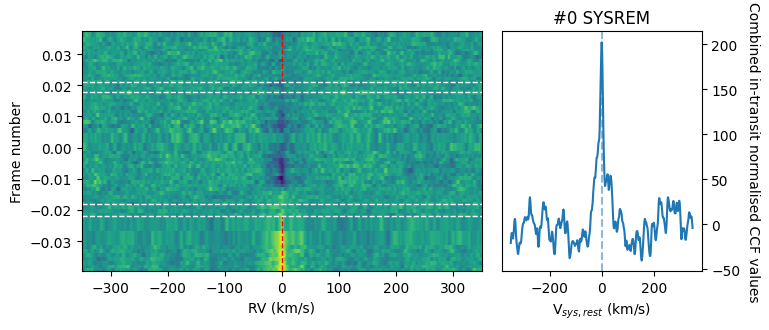

<Figure size 640x480 with 0 Axes>

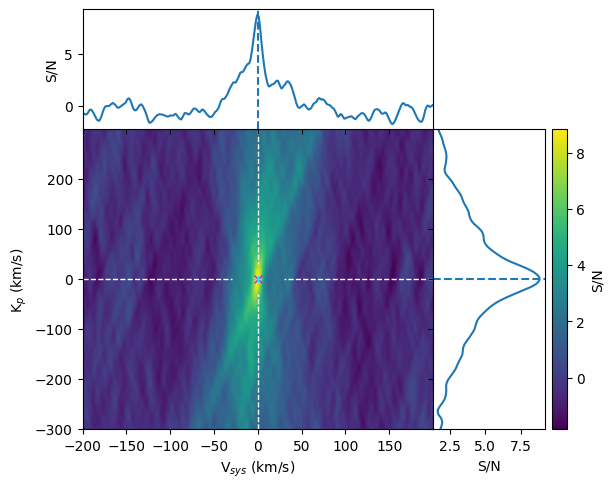

<Figure size 640x480 with 0 Axes>

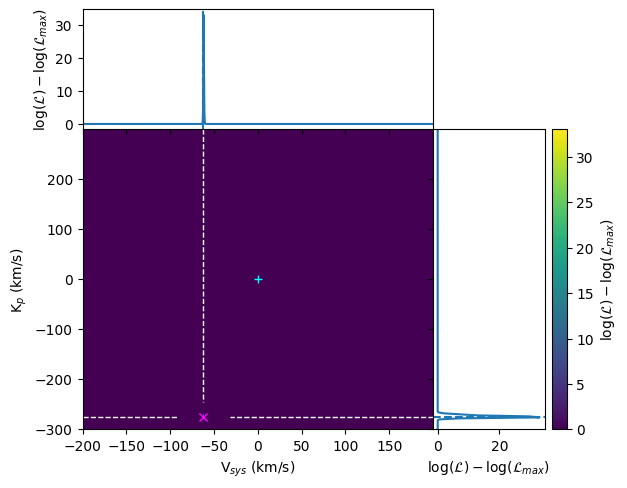

<Figure size 640x480 with 0 Axes>

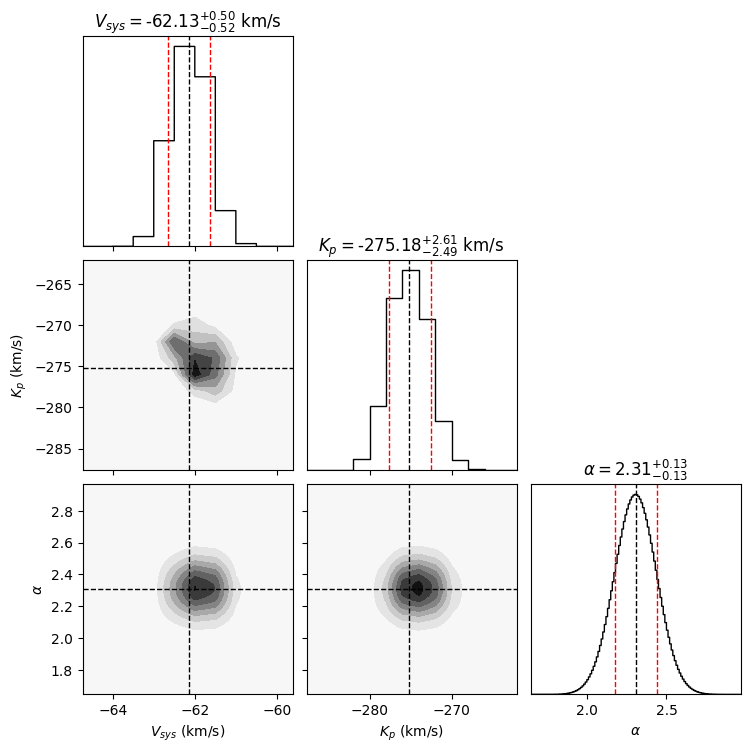

SYSREM 0

Max. peak from S/N map:
Kp = 0.0 km/s
Vsys = 0.0 km/s
S/N = 8.84

Max. peak from likelihood distribution:
Kp = -274.0 km/s
Vsys = -62.0 km/s
Significance = 17.55 (α = 2.31 ± {0.13,0.13})



<Figure size 640x480 with 0 Axes>

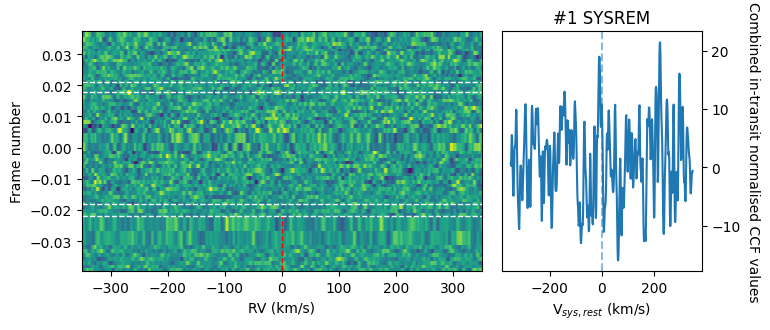

<Figure size 640x480 with 0 Axes>

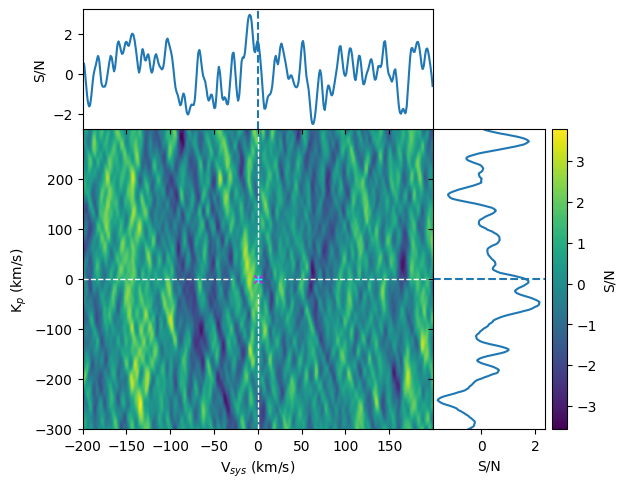

<Figure size 640x480 with 0 Axes>

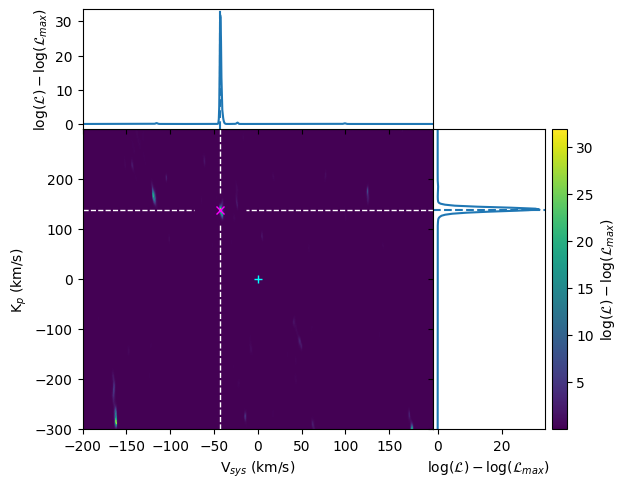

<Figure size 640x480 with 0 Axes>

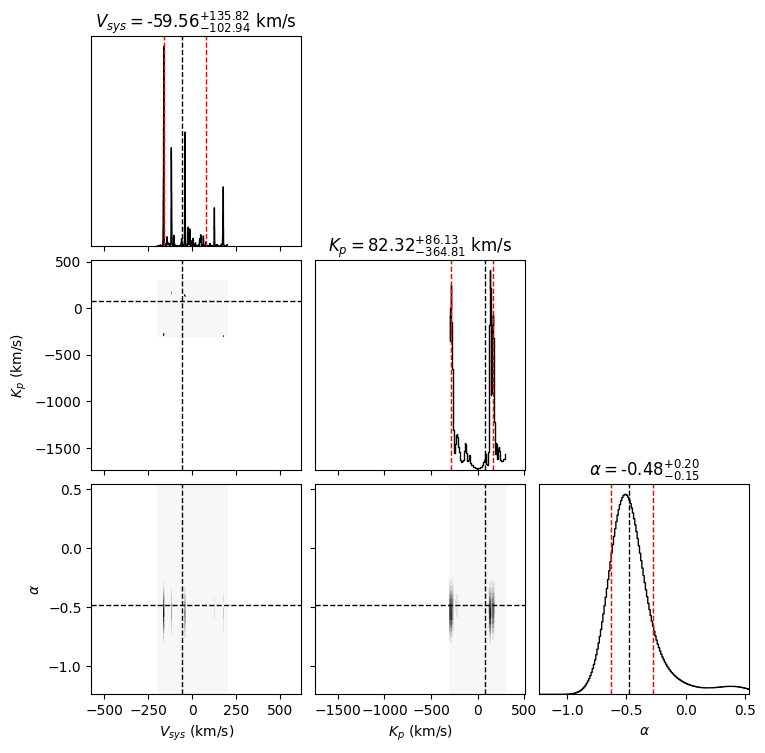

SYSREM 1

Max. peak from S/N map:
Kp = 0.0 km/s
Vsys = 0.0 km/s
S/N = 1.63

Max. peak from likelihood distribution:
Kp = 138.0 km/s
Vsys = -162.0 km/s
Significance = 0.95 (α = 0.12 ± {0.13,0.13})



<Figure size 640x480 with 0 Axes>

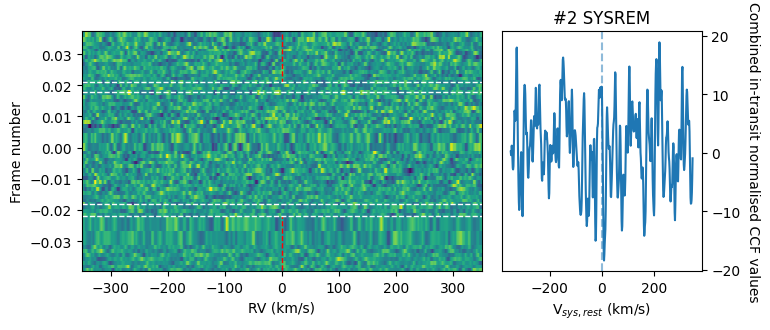

<Figure size 640x480 with 0 Axes>

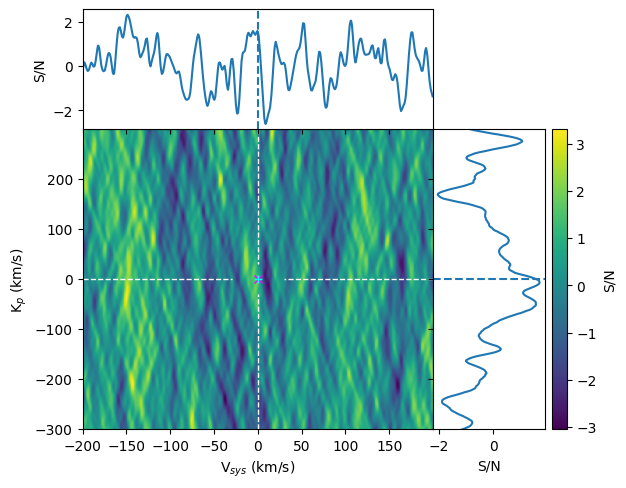

<Figure size 640x480 with 0 Axes>

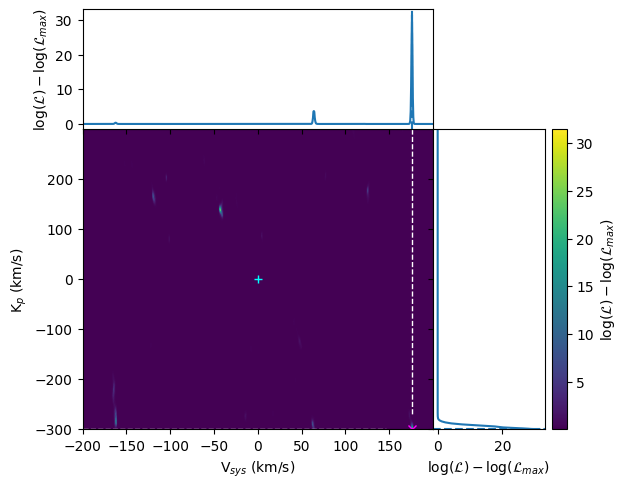

<Figure size 640x480 with 0 Axes>

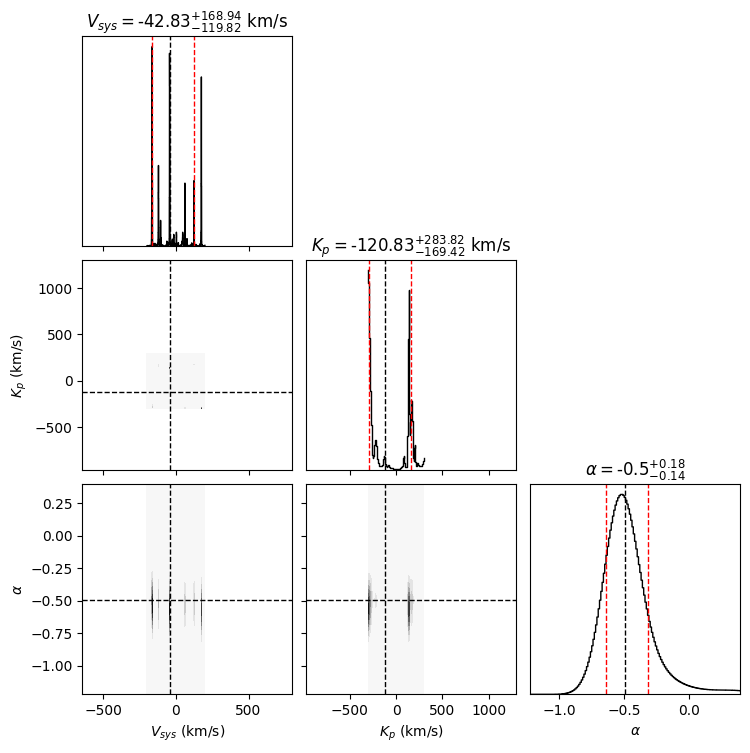

SYSREM 2

Max. peak from S/N map:
Kp = 0.0 km/s
Vsys = 0.0 km/s
S/N = 1.56

Max. peak from likelihood distribution:
Kp = -300.0 km/s
Vsys = -162.0 km/s
Significance = -3.61 (α = -0.45 ± {0.12,0.12})



<Figure size 640x480 with 0 Axes>

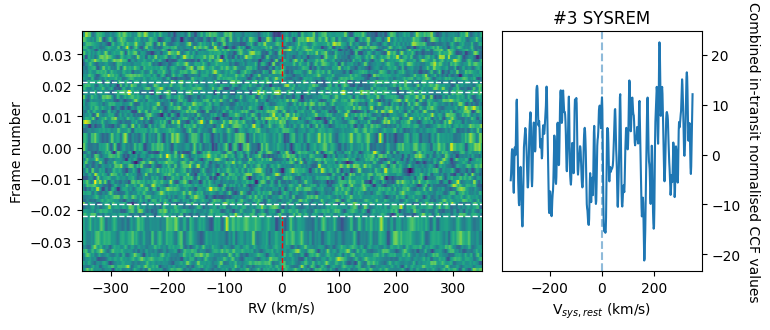

<Figure size 640x480 with 0 Axes>

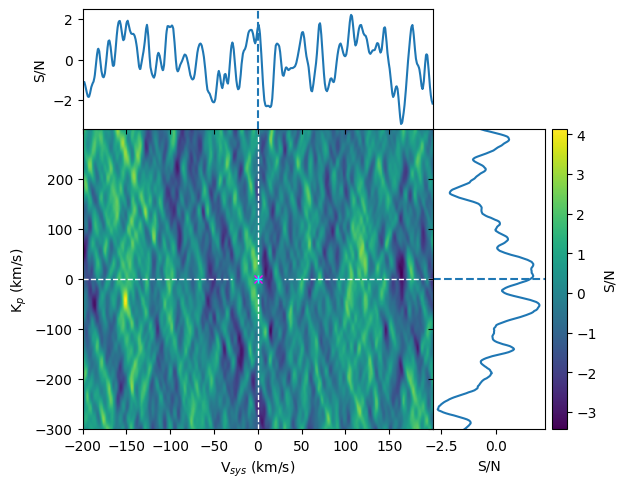

<Figure size 640x480 with 0 Axes>

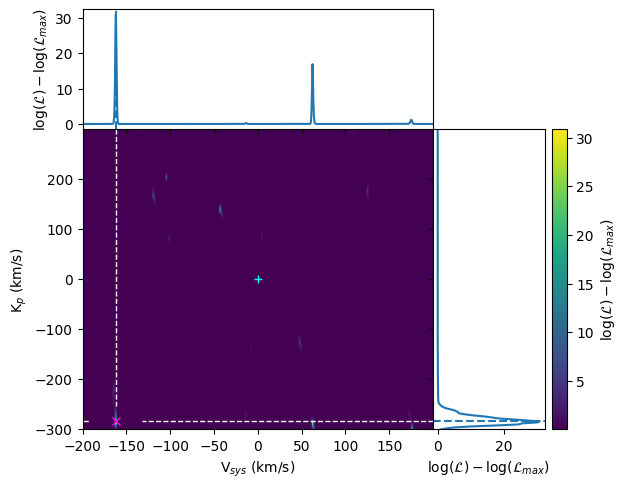

<Figure size 640x480 with 0 Axes>

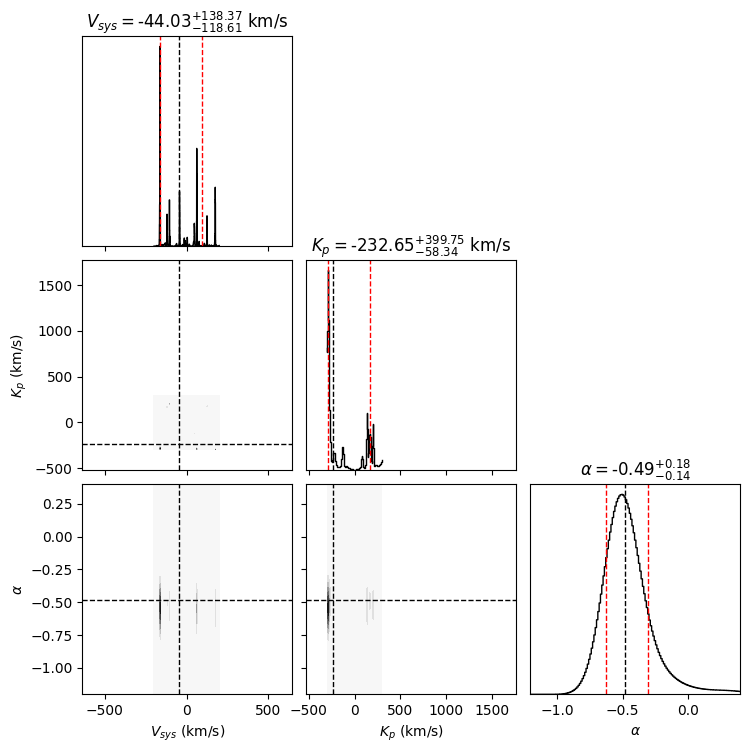

SYSREM 3

Max. peak from S/N map:
Kp = 0.0 km/s
Vsys = 0.0 km/s
S/N = 1.56

Max. peak from likelihood distribution:
Kp = -288.0 km/s
Vsys = -162.0 km/s
Significance = -4.59 (α = -0.57 ± {0.12,0.12})



<Figure size 640x480 with 0 Axes>

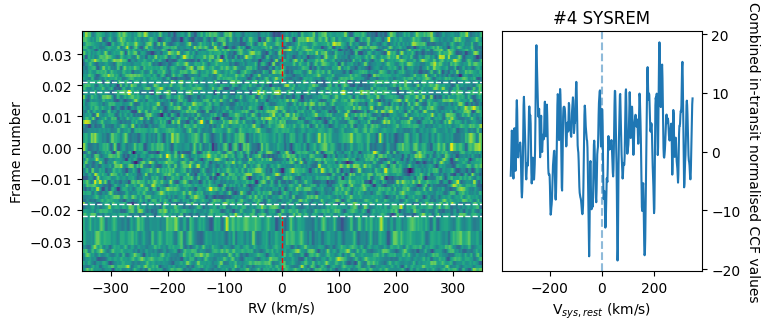

<Figure size 640x480 with 0 Axes>

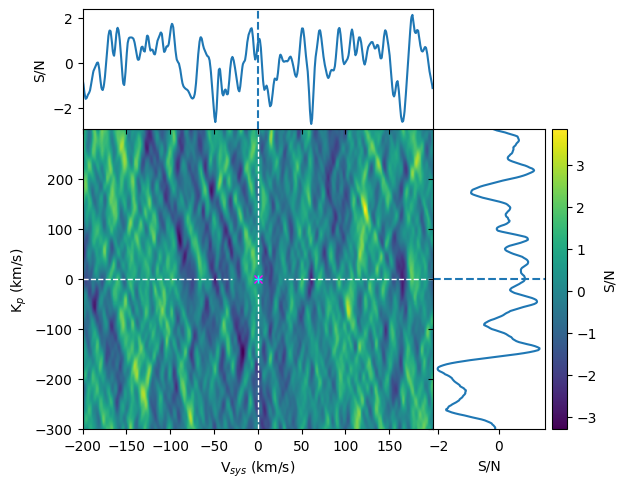

<Figure size 640x480 with 0 Axes>

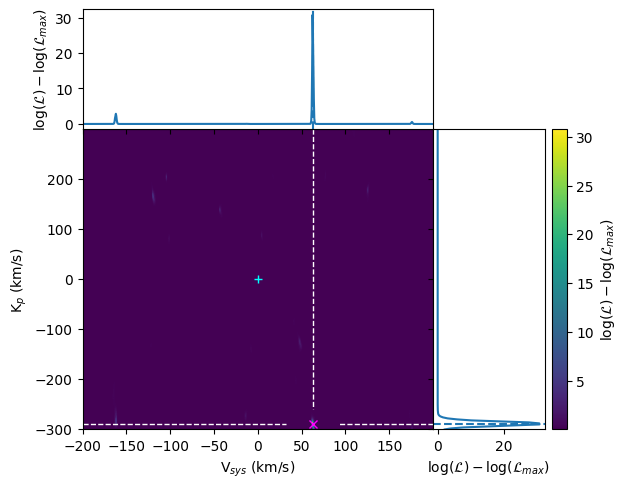

<Figure size 640x480 with 0 Axes>

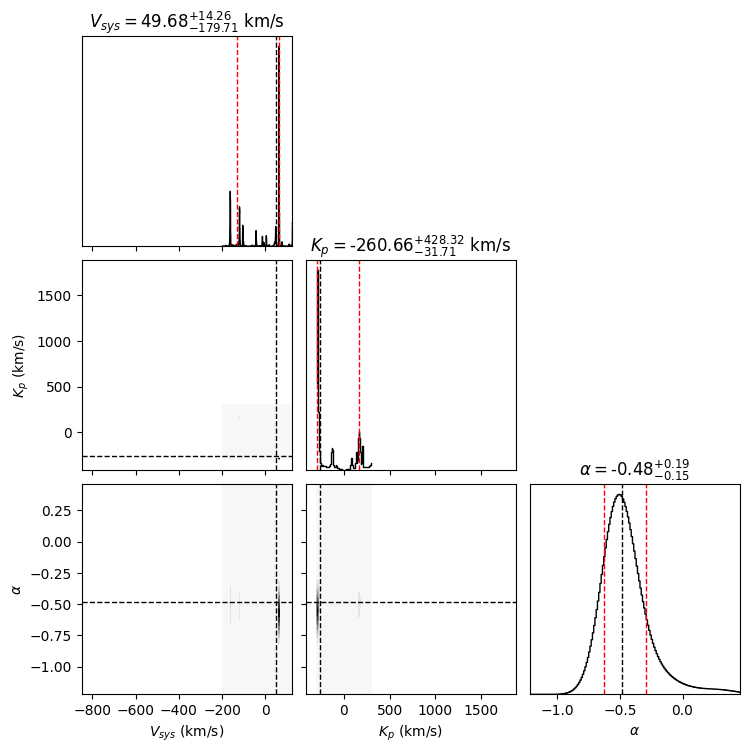

SYSREM 4

Max. peak from S/N map:
Kp = 0.0 km/s
Vsys = 0.0 km/s
S/N = 0.86

Max. peak from likelihood distribution:
Kp = -288.0 km/s
Vsys = 62.5 km/s
Significance = -4.79 (α = -0.59 ± {0.12,0.12})



<Figure size 640x480 with 0 Axes>

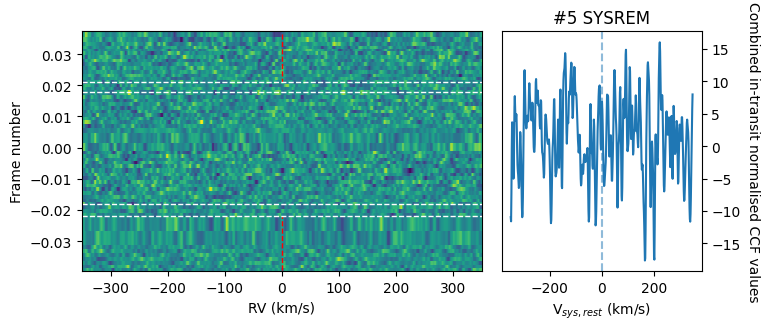

<Figure size 640x480 with 0 Axes>

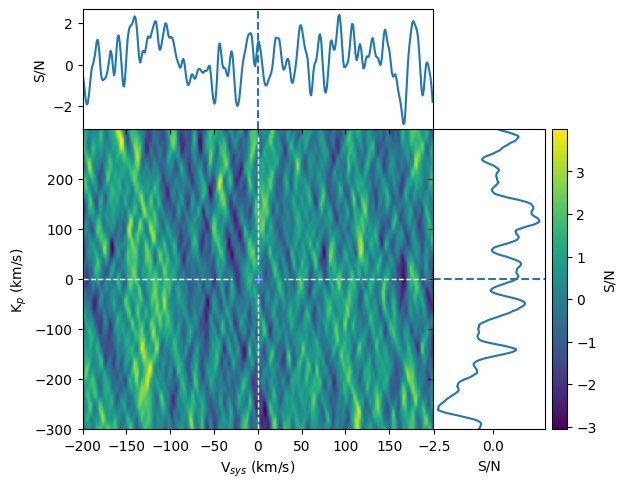

<Figure size 640x480 with 0 Axes>

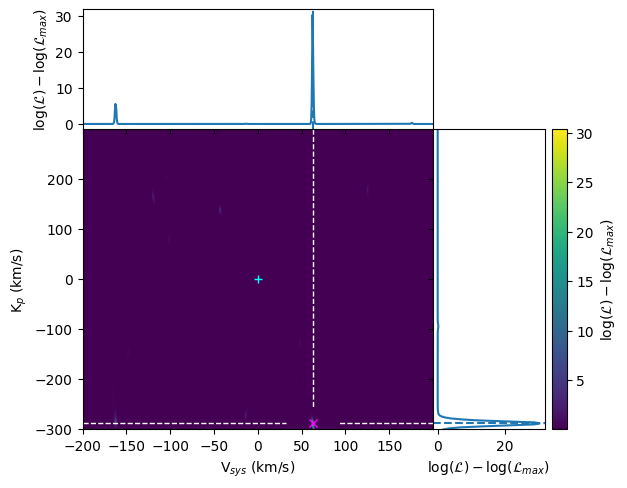

<Figure size 640x480 with 0 Axes>

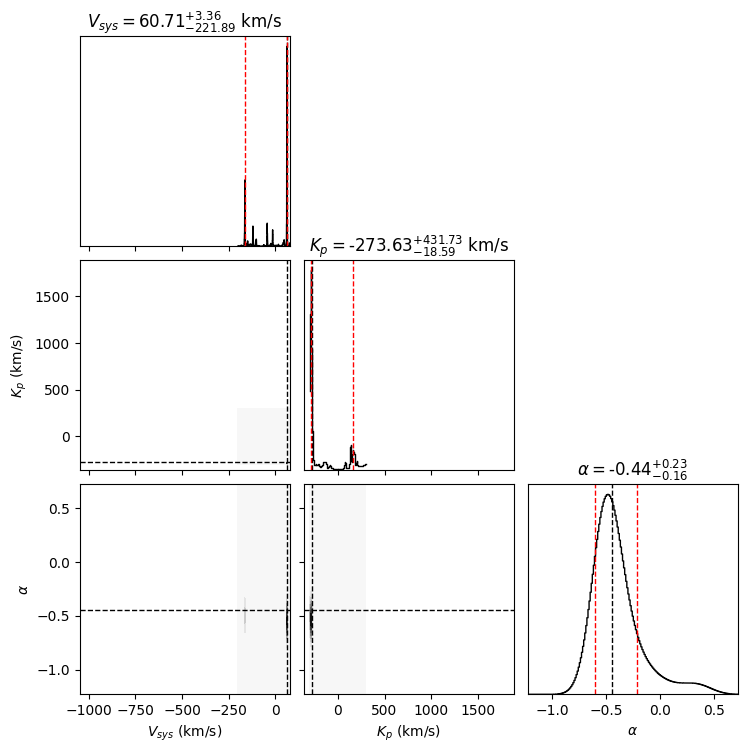

SYSREM 5

Max. peak from S/N map:
Kp = 0.0 km/s
Vsys = 0.0 km/s
S/N = 1.01

Max. peak from likelihood distribution:
Kp = -288.0 km/s
Vsys = 62.5 km/s
Significance = -4.69 (α = -0.57 ± {0.12,0.12})



<Figure size 640x480 with 0 Axes>

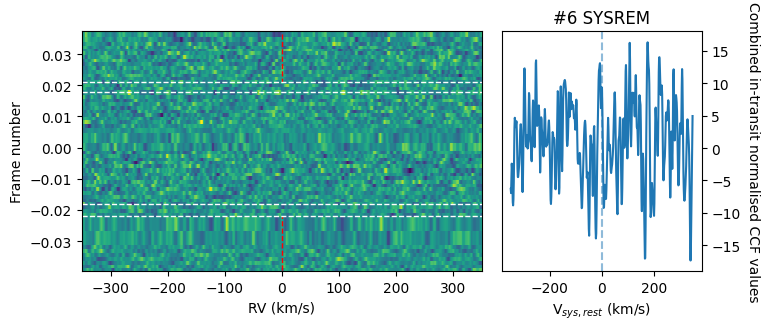

<Figure size 640x480 with 0 Axes>

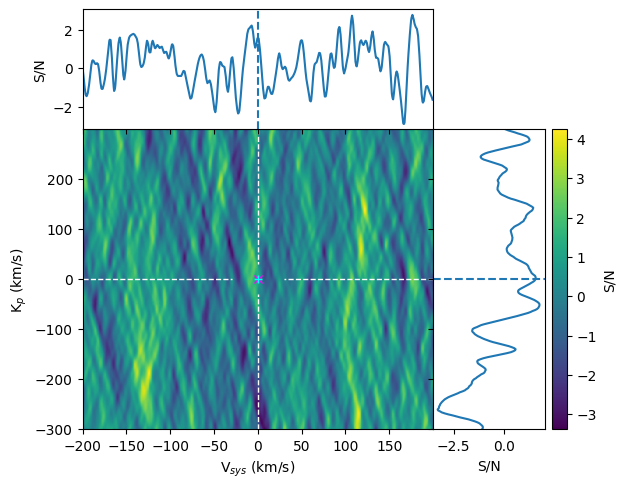

<Figure size 640x480 with 0 Axes>

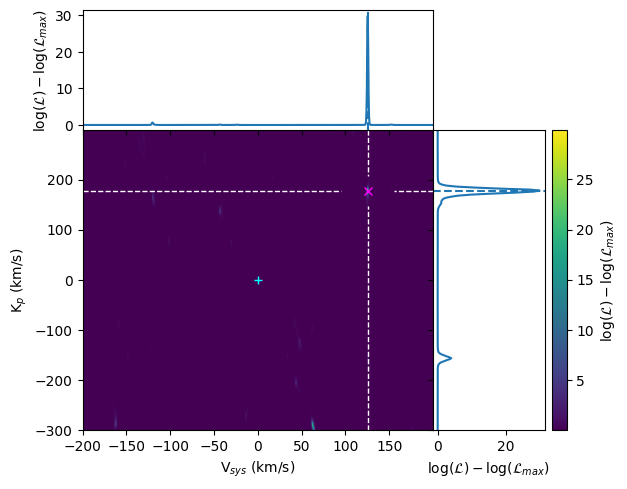

<Figure size 640x480 with 0 Axes>

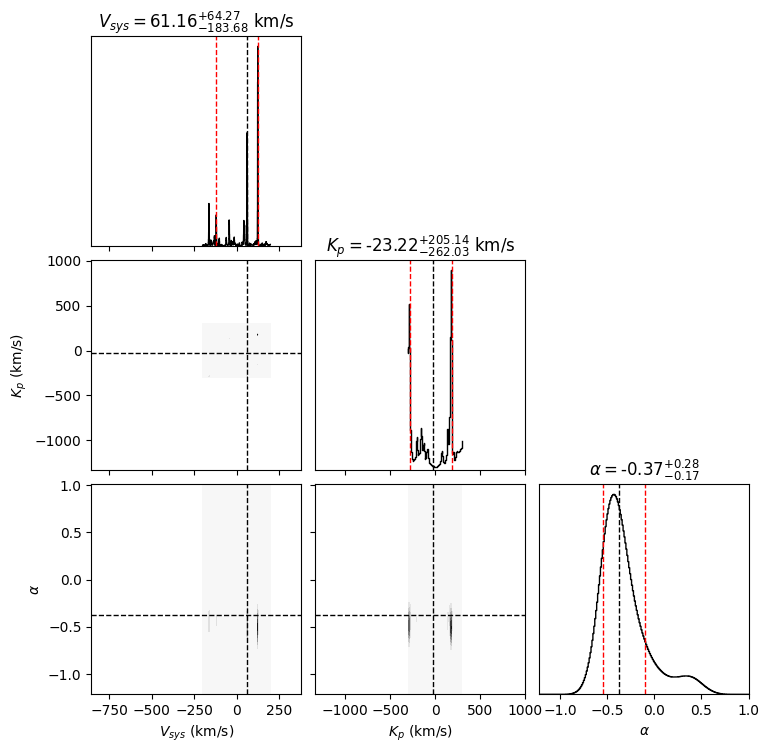

SYSREM 6

Max. peak from S/N map:
Kp = 0.0 km/s
Vsys = 0.0 km/s
S/N = 1.57

Max. peak from likelihood distribution:
Kp = 178.0 km/s
Vsys = 125.5 km/s
Significance = -4.44 (α = -0.53 ± {0.12,0.12})



<Figure size 640x480 with 0 Axes>

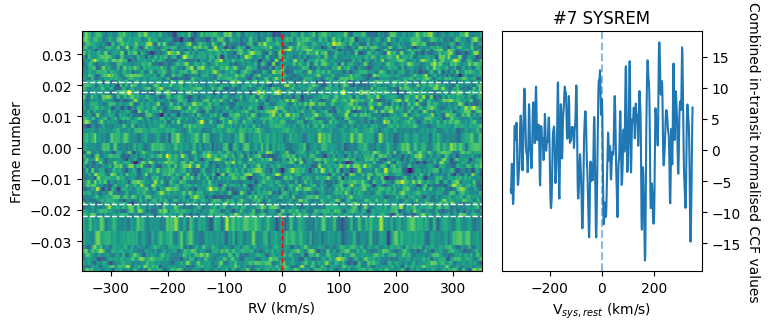

<Figure size 640x480 with 0 Axes>

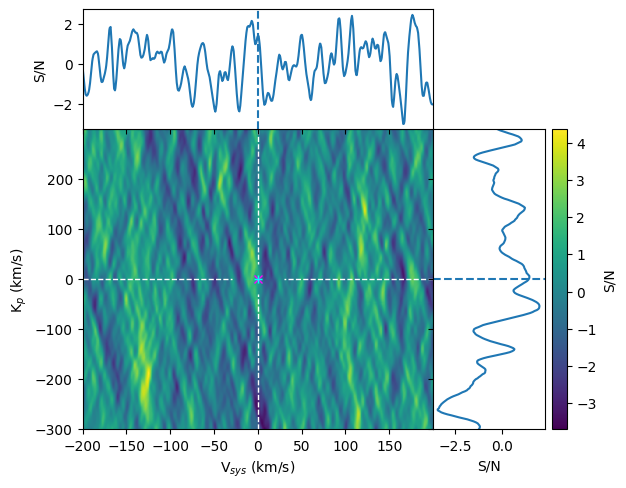

<Figure size 640x480 with 0 Axes>

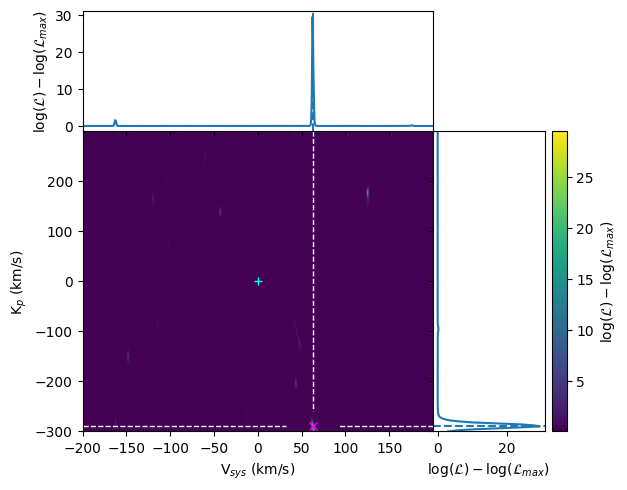

<Figure size 640x480 with 0 Axes>

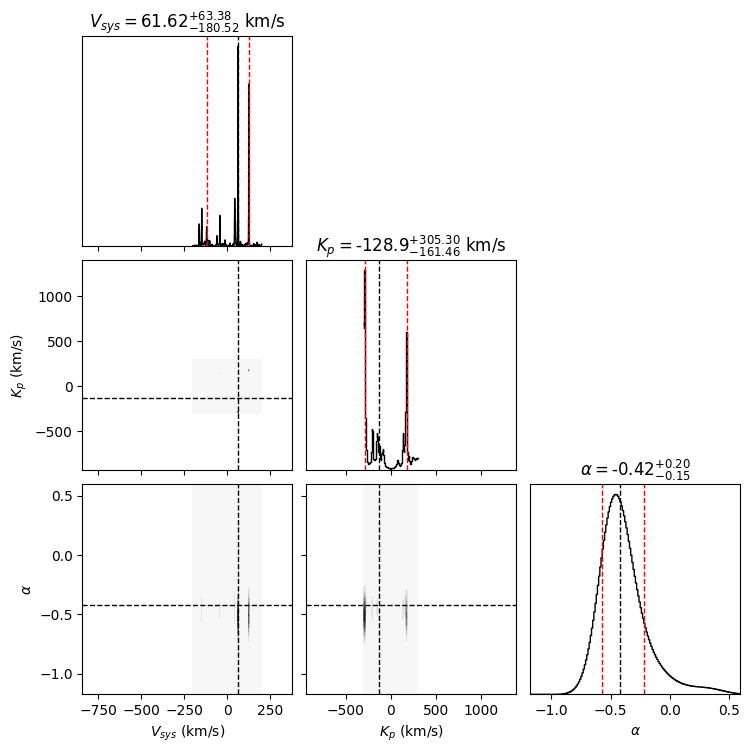

SYSREM 7

Max. peak from S/N map:
Kp = 0.0 km/s
Vsys = 0.0 km/s
S/N = 1.4

Max. peak from likelihood distribution:
Kp = -290.0 km/s
Vsys = 62.5 km/s
Significance = -4.57 (α = -0.54 ± {0.12,0.12})



<Figure size 640x480 with 0 Axes>

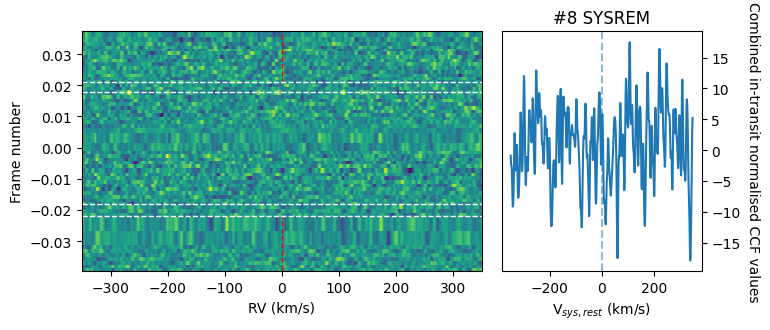

<Figure size 640x480 with 0 Axes>

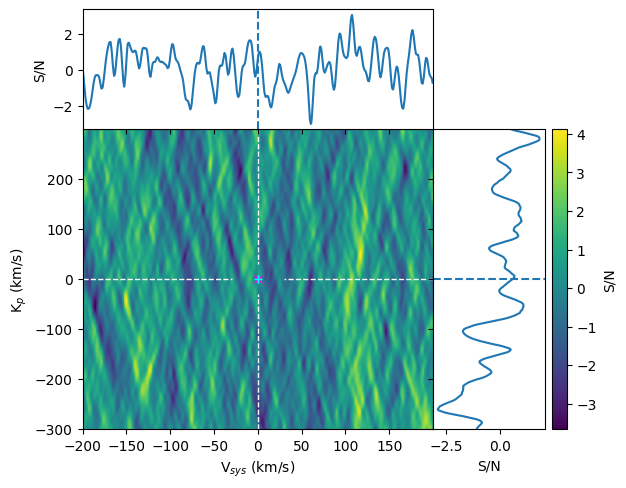

<Figure size 640x480 with 0 Axes>

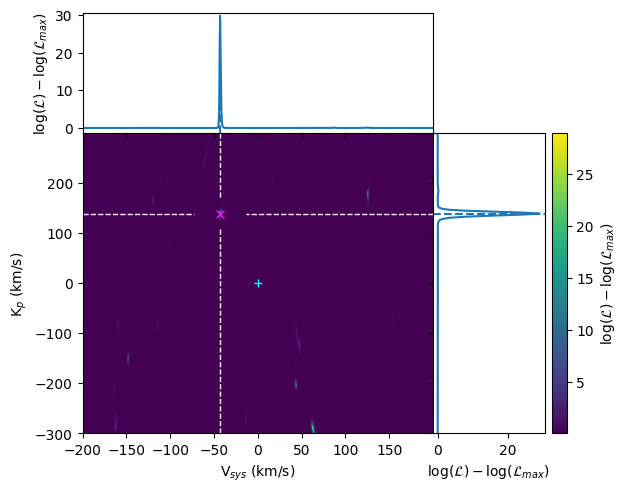

<Figure size 640x480 with 0 Axes>

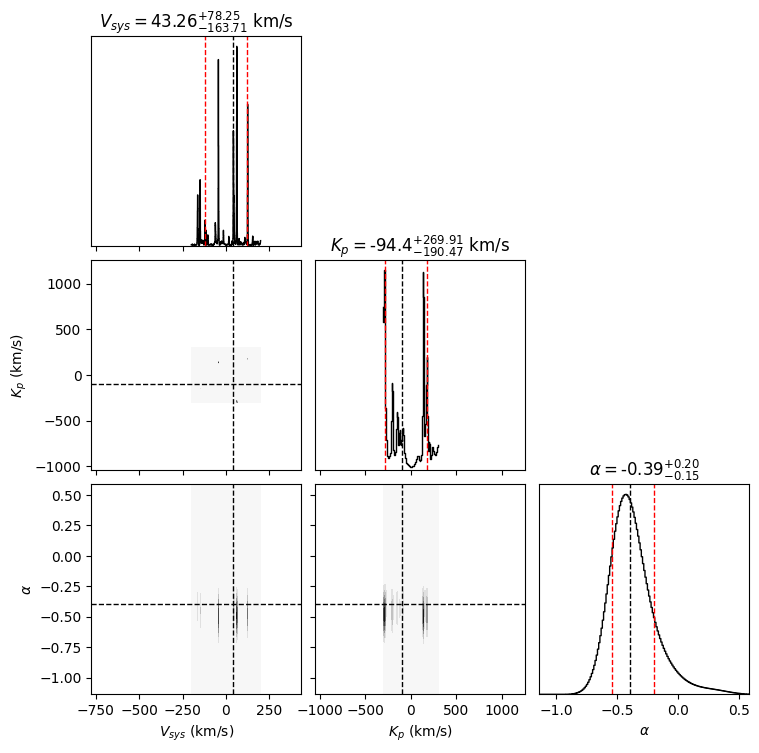

SYSREM 8

Max. peak from S/N map:
Kp = 0.0 km/s
Vsys = 0.0 km/s
S/N = 0.59

Max. peak from likelihood distribution:
Kp = -288.0 km/s
Vsys = 63.0 km/s
Significance = -4.36 (α = -0.51 ± {0.12,0.12})



<Figure size 640x480 with 0 Axes>

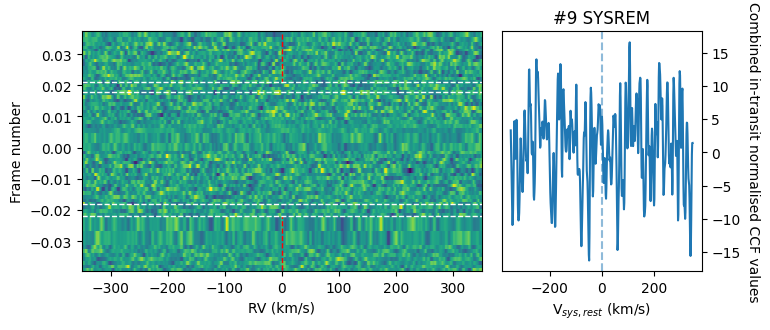

<Figure size 640x480 with 0 Axes>

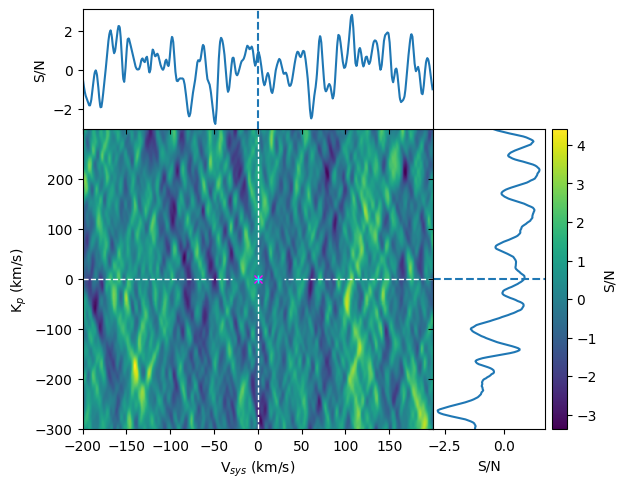

<Figure size 640x480 with 0 Axes>

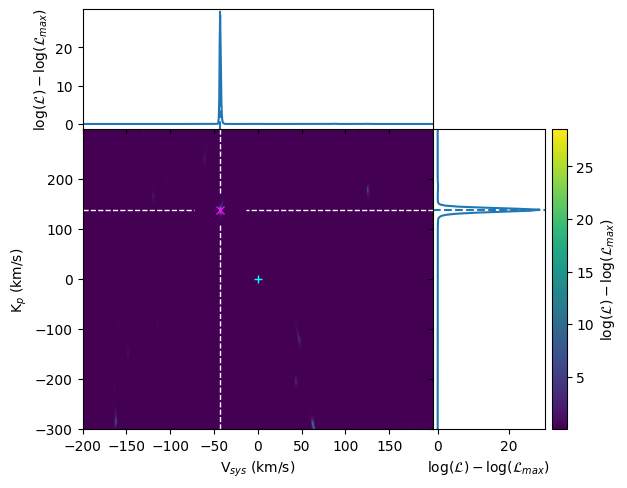

<Figure size 640x480 with 0 Axes>

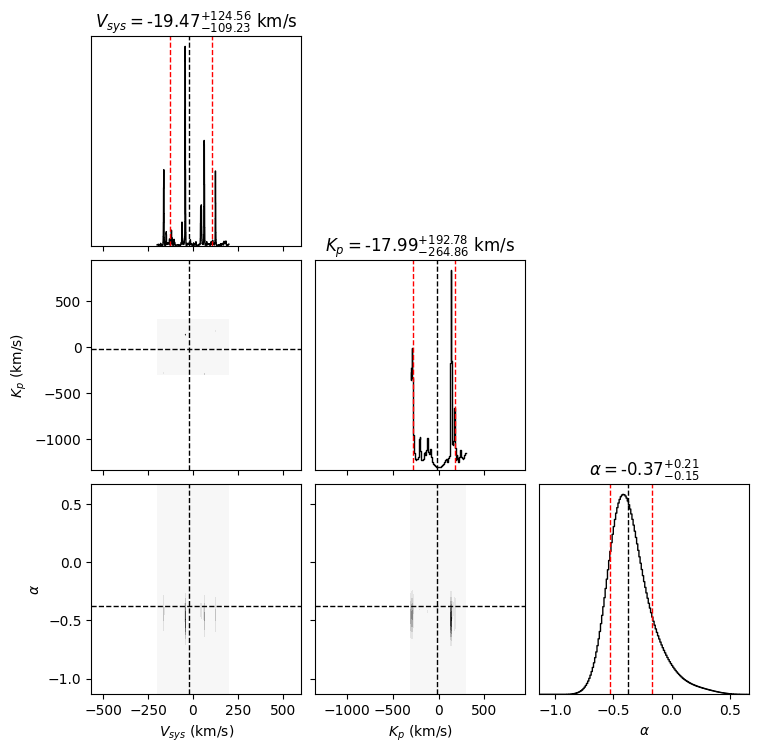

SYSREM 9

Max. peak from S/N map:
Kp = 0.0 km/s
Vsys = 0.0 km/s
S/N = 0.84

Max. peak from likelihood distribution:
Kp = 138.0 km/s
Vsys = -43.0 km/s
Significance = -4.48 (α = -0.51 ± {0.11,0.11})



<Figure size 640x480 with 0 Axes>

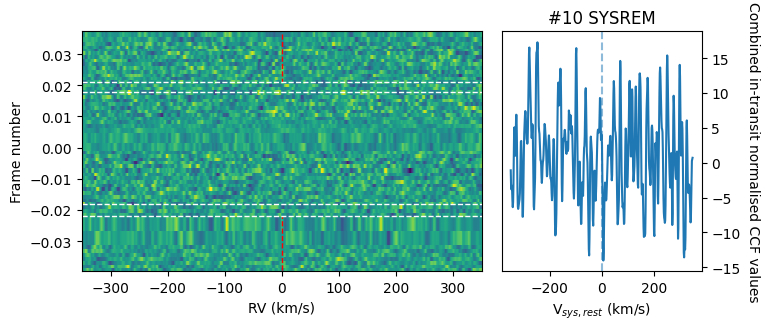

<Figure size 640x480 with 0 Axes>

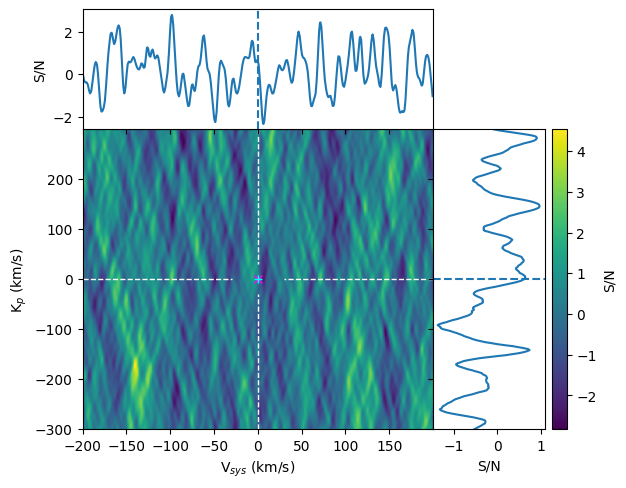

<Figure size 640x480 with 0 Axes>

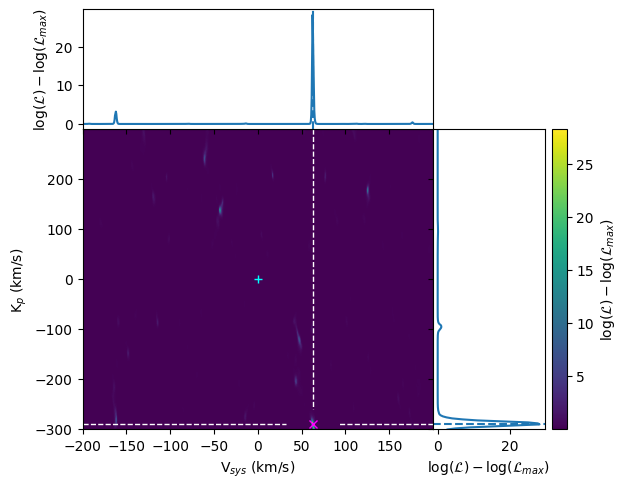

<Figure size 640x480 with 0 Axes>

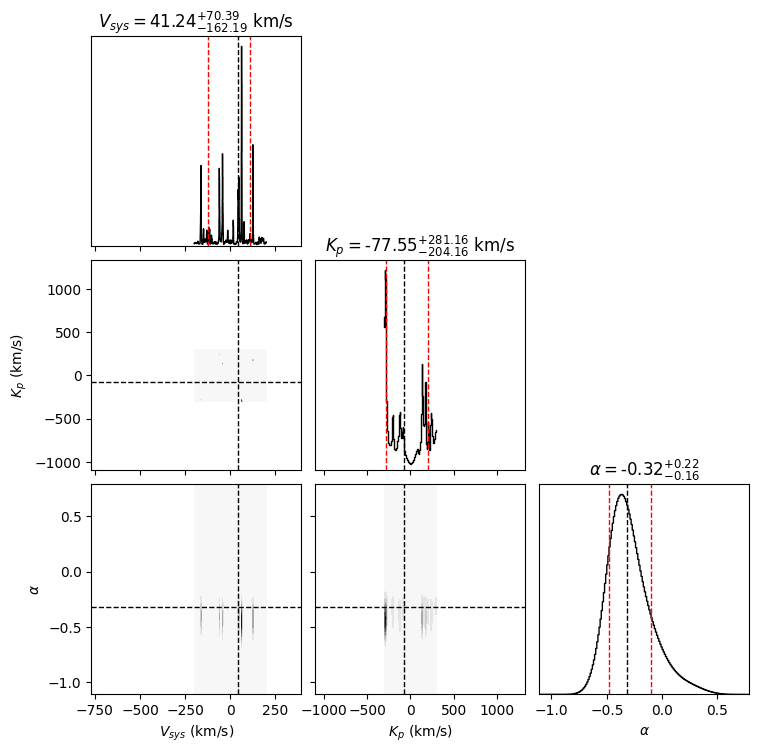

SYSREM 10

Max. peak from S/N map:
Kp = 0.0 km/s
Vsys = 0.0 km/s
S/N = 0.62

Max. peak from likelihood distribution:
Kp = -288.0 km/s
Vsys = 62.5 km/s
Significance = -4.21 (α = -0.47 ± {0.11,0.11})



<Figure size 640x480 with 0 Axes>

In [6]:
# summing up at telluric rest-frame using planet model

sampling = 1.30
RV_sample = np.arange(-350,350,sampling)    # in km/s
Kp_sample = np.arange(-300,300,2.0)           # in km/s
Vsys_sample = np.arange(-200,200,0.5)       # in km/s
Kp_planet = 0.0                          
Vsys_planet = 0.0                       
A_sample = np.arange(-5.,5.,0.01)
sys_num = 10

wvdat,fluxdat,errdat = wave_data,flux_data,error_data 

# reading model
flux_modelmol = pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_vorbplanet_flux_normalized.pkl')
wave_modelmol = pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_vorbplanet_wave_normalized.pkl')

cctotal, snmap_pnet = detect_molecules(wvdat,fluxdat,errdat,wave_modelmol,flux_modelmol,sys_num+1,carm_order,
                RV_sample,Kp_sample,Vsys_sample,A_sample,
                Kp_planet,Vsys_planet,out_transit_mask,rvcor,phase,std_brogi=False,plot=True)

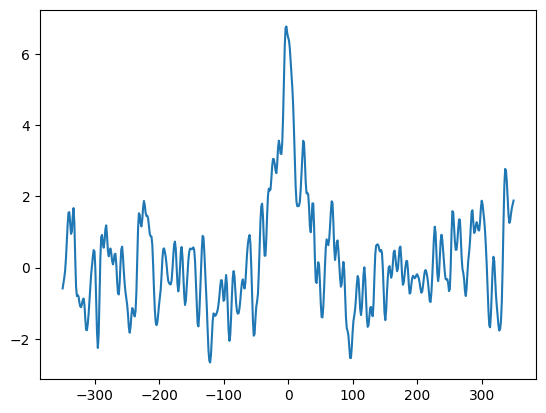

In [7]:
def find_nearest(array, value):
    return (np.abs(np.asarray(array) - value)).argmin()

min_lim = find_nearest(RV_sample,-100)
max_lim = find_nearest(RV_sample,100)
cctotal_nan = cctotal[0].copy()
cctotal_nan[:,min_lim:max_lim] = np.NaN
#np.nanstd(cctotal_nan)
plt.plot(RV_sample,cctotal[0][0]/np.nanstd(cctotal_nan))


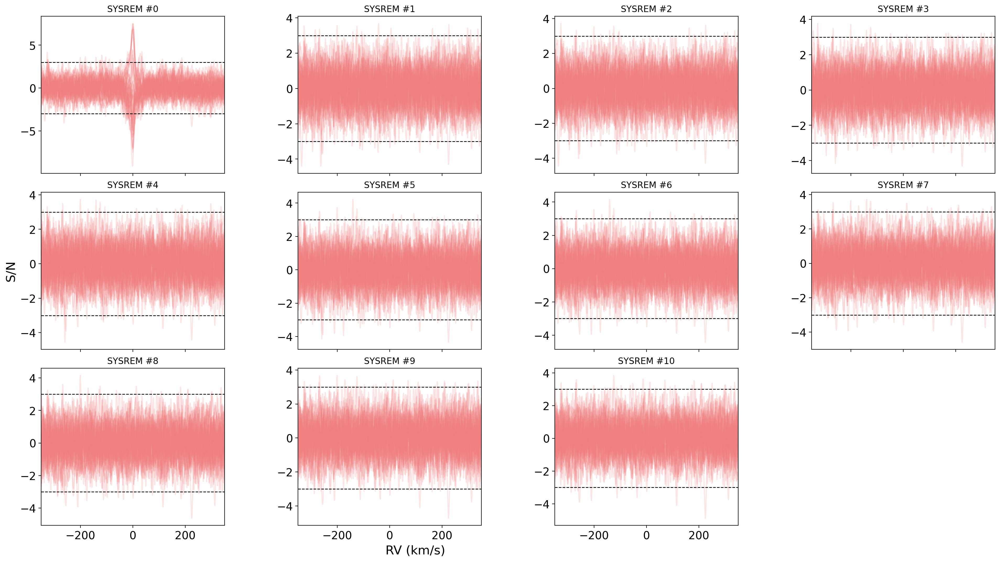

<Figure size 640x480 with 0 Axes>

In [8]:
# iter = np.array([[0,1],[2,3],[4,5],[6,7],[8,9],[10]])
iter = np.array([[0,1,2,3],[4,5,6,7],[8,9,10,11]])

fig = plt.figure(figsize=(7, 6),dpi=200)
lbl = 17
fig.supxlabel("RV (km/s)",y=-(0.52+0.52+0.18),x=1.02,fontsize=lbl)
k1 = 0
for i in range(len(iter)):
    k2 = 0
    for idx,j in enumerate(iter[i]):
        if i==len(iter)-1 and j==11:
            pass
        else:
            axes_kpvsysmap = [0+k2, 0-k1, 0.5, 0.5]
            kpvsysmap = plt.axes(axes_kpvsysmap)

            cctotal_nan = cctotal[j].copy()
            cctotal_nan[:,min_lim:max_lim] = np.NaN
            for k in range(len(cctotal[j])):
                kpvsysmap.plot(RV_sample,cctotal[j][k]/np.nanstd(cctotal_nan),c='lightcoral',alpha=0.2)
            
            # kpvsysmap.plot(RV_sample,np.sum(cctotal[j],axis=0),c='lightcoral',alpha=1)

            kpvsysmap.set_title('SYSREM #'+str(j))

            # if idx == 1 or idx == 2 or idx == 3:
            #     kpvsysmap.set_yticklabels([])
            k2+=0.7
            if i != len(iter)-1:
                kpvsysmap.set_xticklabels([])
            if i == 1 and idx == 0:
                # kpvsysmap.set_xlabel("$V_\mathrm{rest}$ (km s$^{-1}$)",y=-(0.52+0.52+0.52),fontsize=lbl)
                kpvsysmap.set_ylabel("S/N",fontsize=lbl)

            # kpvsysmap.set_ylim(-10,10)
            kpvsysmap.set_xlim(-350,350)
            kpvsysmap.tick_params(axis='both', which='major', labelsize=15)
            kpvsysmap.axhline(y=-3,ls='--',c='black',lw=1)
            kpvsysmap.axhline(y=3,ls='--',c='black',lw=1)

    k1+=0.56

plt.savefig("figures/h2opokaz_snmap.pdf",format="pdf",dpi=200,bbox_inches="tight",pad_inches=0.1)
plt.show(block=False)
plt.clf()

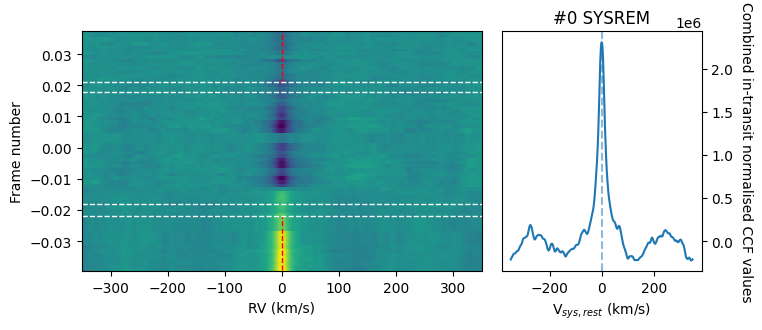

<Figure size 640x480 with 0 Axes>

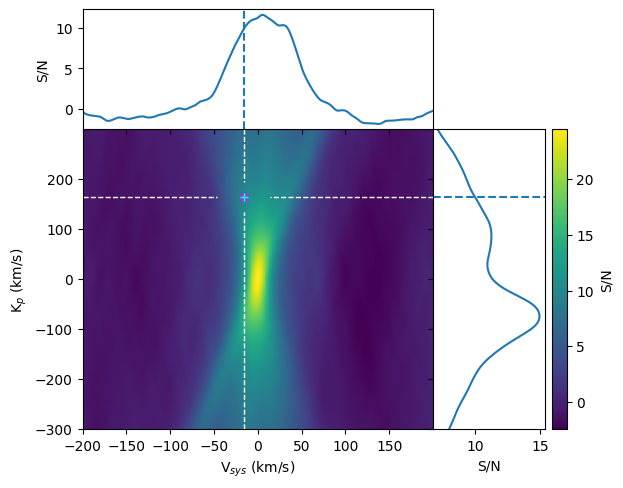

<Figure size 640x480 with 0 Axes>

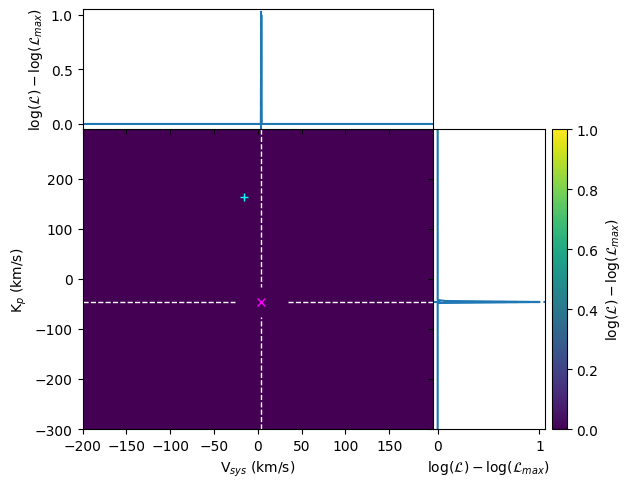

<Figure size 640x480 with 0 Axes>

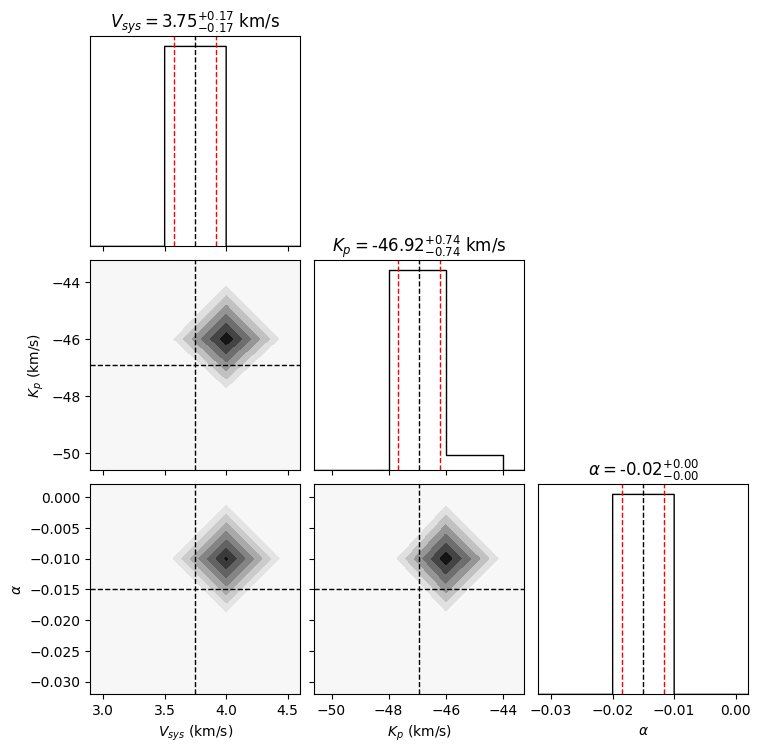

SYSREM 0

Max. peak from S/N map:
Kp = 164.0 km/s
Vsys = -16.0 km/s
S/N = 9.95

Max. peak from likelihood distribution:
Kp = -46.0 km/s
Vsys = 4.0 km/s
Significance = -4.39 (α = -0.02 ± {0.00,0.00})



<Figure size 640x480 with 0 Axes>

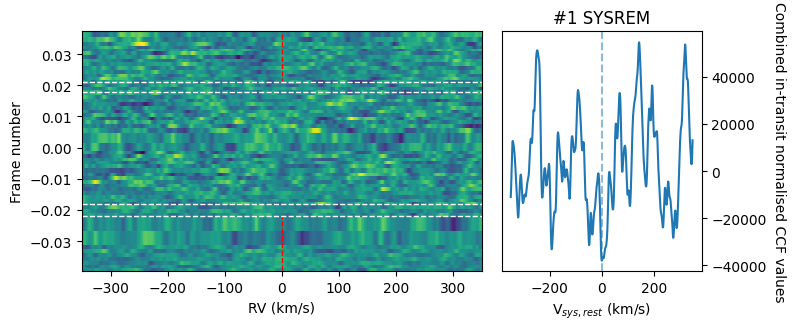

<Figure size 640x480 with 0 Axes>

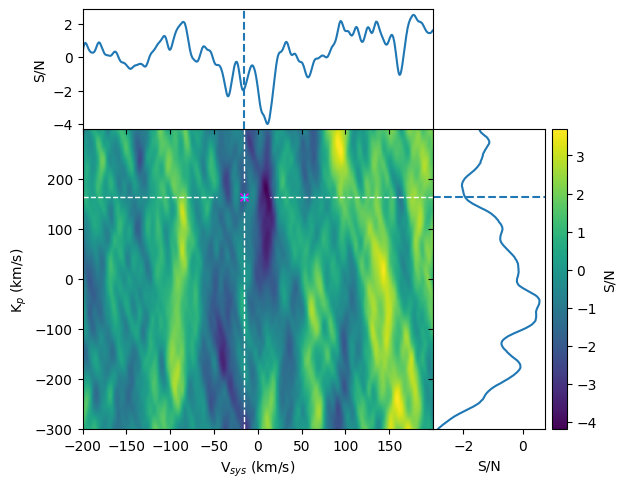

<Figure size 640x480 with 0 Axes>

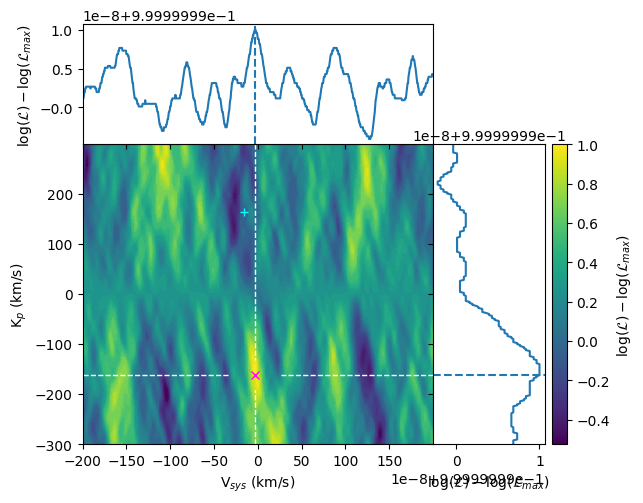

<Figure size 640x480 with 0 Axes>

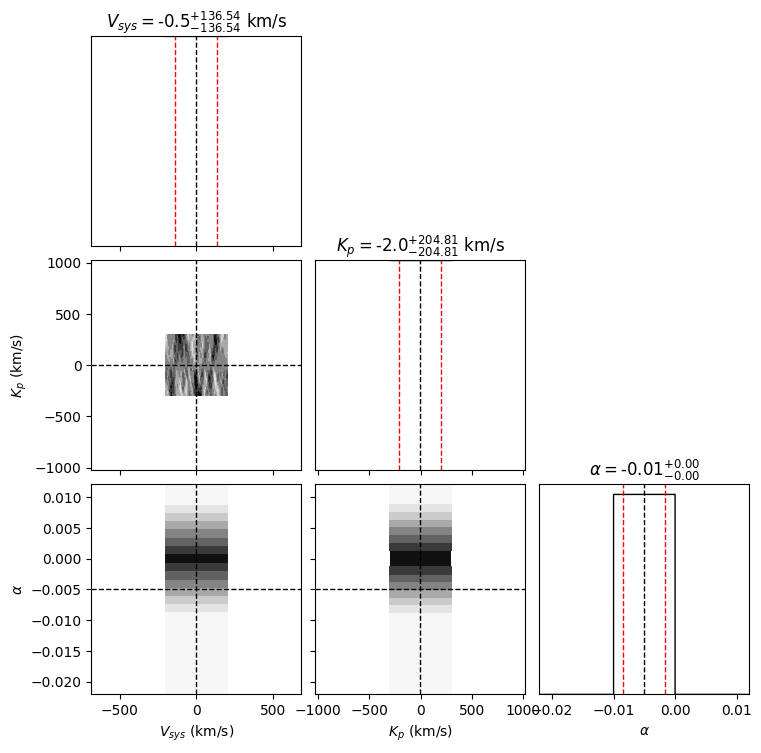

SYSREM 1

Max. peak from S/N map:
Kp = 164.0 km/s
Vsys = -16.0 km/s
S/N = -1.95

Max. peak from likelihood distribution:
Kp = 6.0 km/s
Vsys = -165.5 km/s
Significance = -1.46 (α = -0.01 ± {0.00,0.00})



<Figure size 640x480 with 0 Axes>

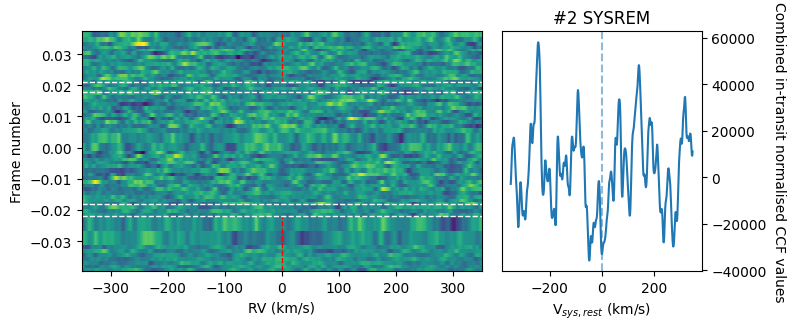

<Figure size 640x480 with 0 Axes>

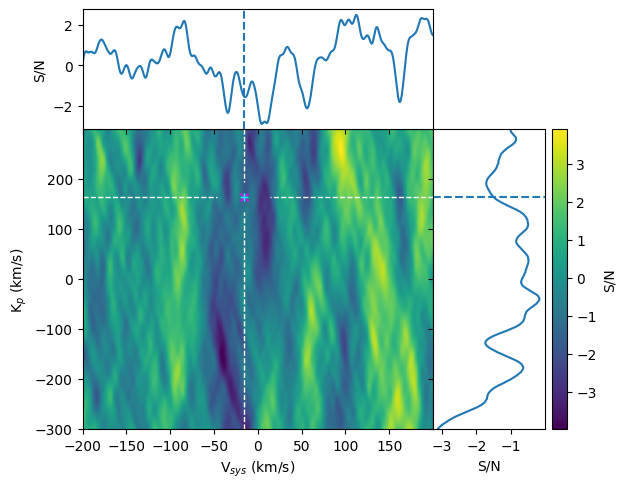

<Figure size 640x480 with 0 Axes>

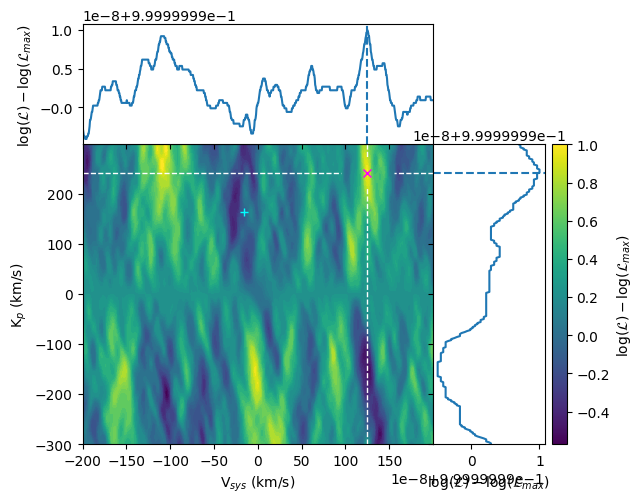

<Figure size 640x480 with 0 Axes>

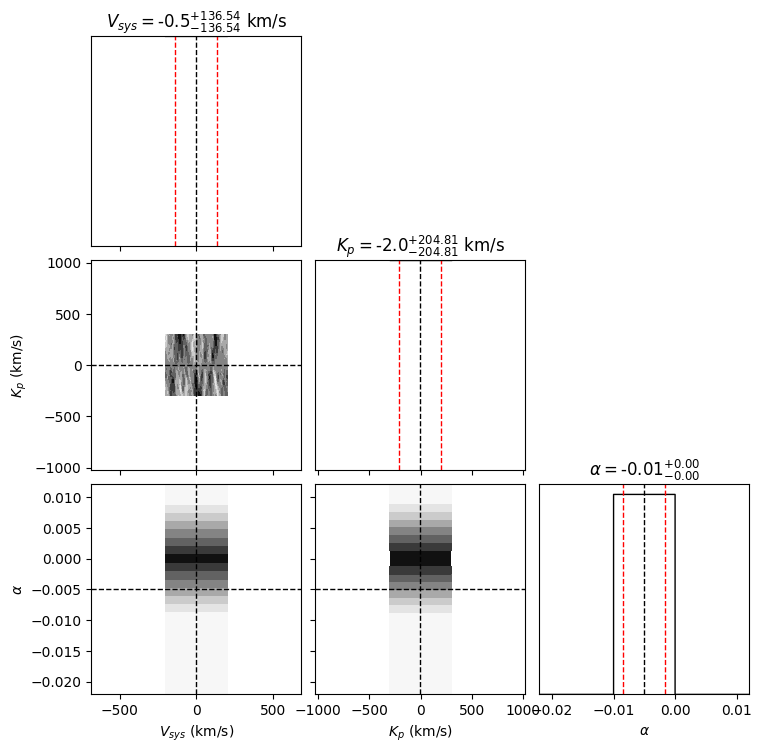

SYSREM 2

Max. peak from S/N map:
Kp = 164.0 km/s
Vsys = -16.0 km/s
S/N = -1.52

Max. peak from likelihood distribution:
Kp = 18.0 km/s
Vsys = -165.5 km/s
Significance = -1.46 (α = -0.01 ± {0.00,0.00})



<Figure size 640x480 with 0 Axes>

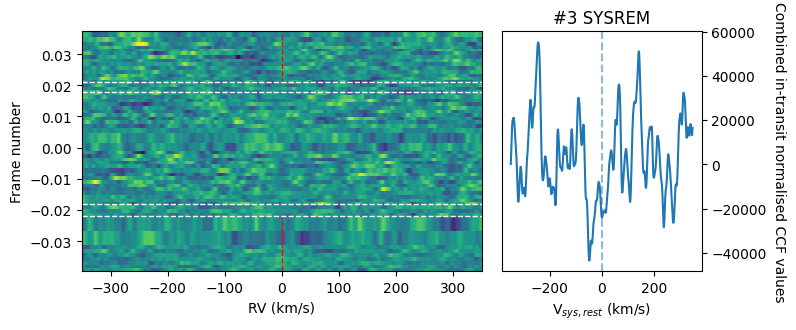

<Figure size 640x480 with 0 Axes>

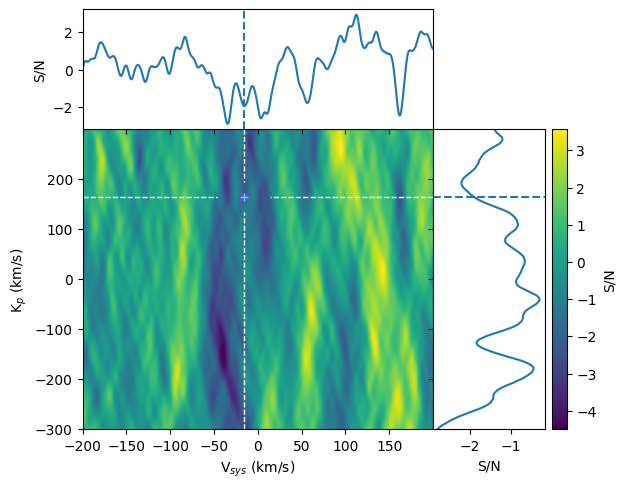

<Figure size 640x480 with 0 Axes>

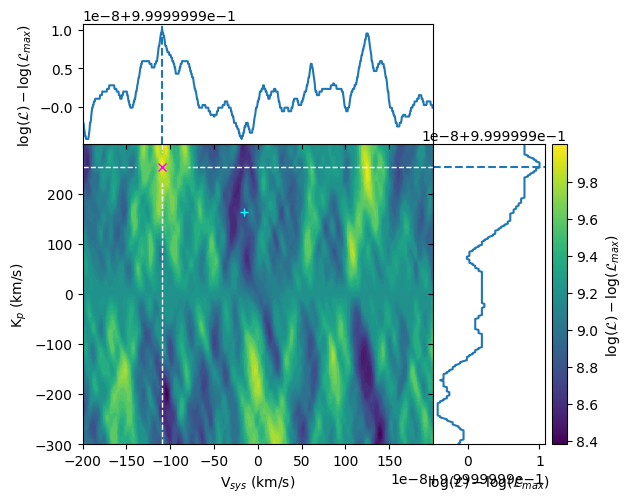

<Figure size 640x480 with 0 Axes>

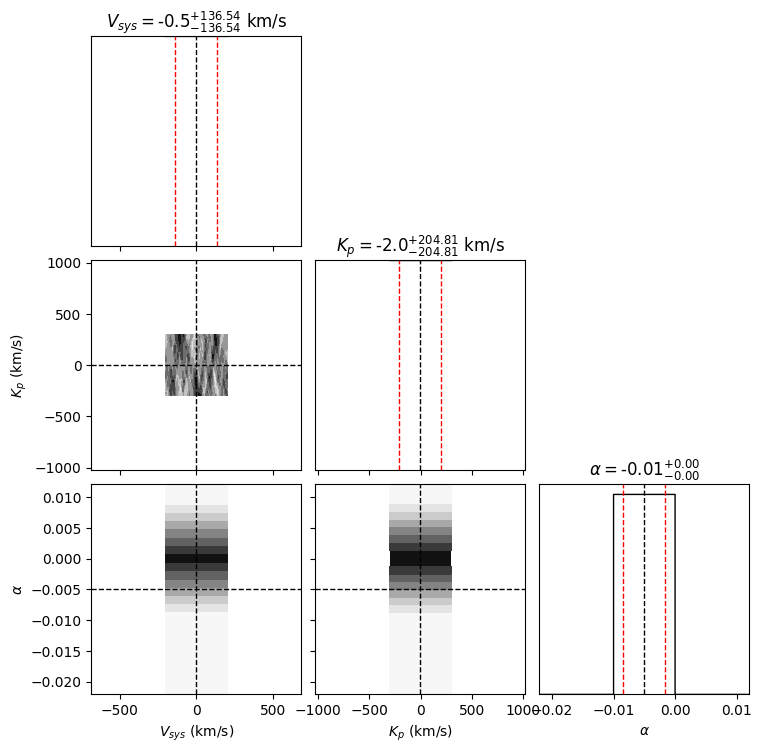

SYSREM 3

Max. peak from S/N map:
Kp = 164.0 km/s
Vsys = -16.0 km/s
S/N = -1.91

Max. peak from likelihood distribution:
Kp = 16.0 km/s
Vsys = -143.5 km/s
Significance = -1.46 (α = -0.01 ± {0.00,0.00})



<Figure size 640x480 with 0 Axes>

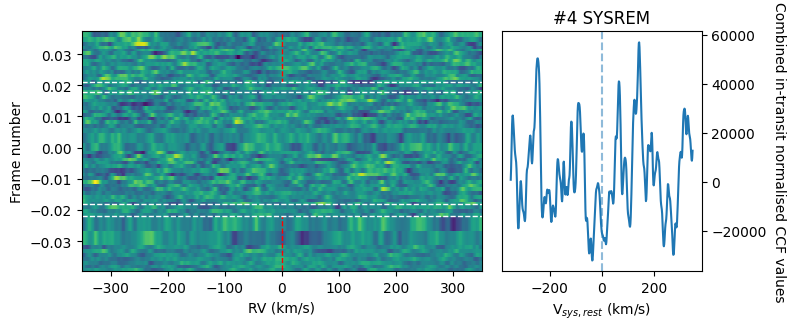

<Figure size 640x480 with 0 Axes>

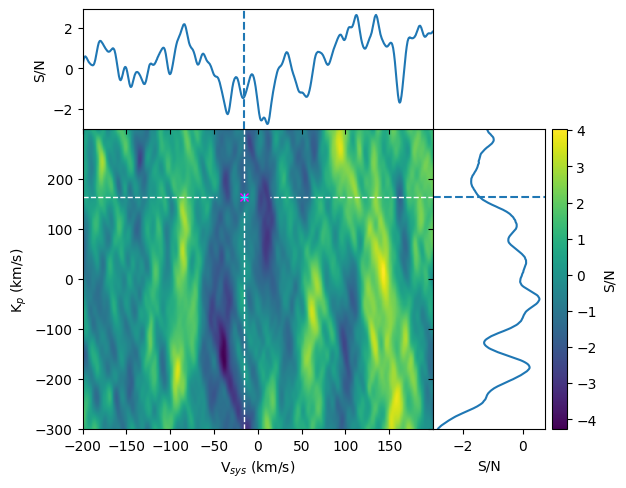

<Figure size 640x480 with 0 Axes>

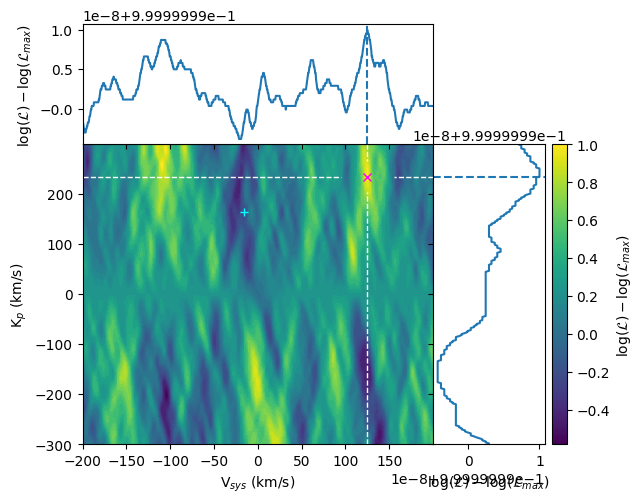

<Figure size 640x480 with 0 Axes>

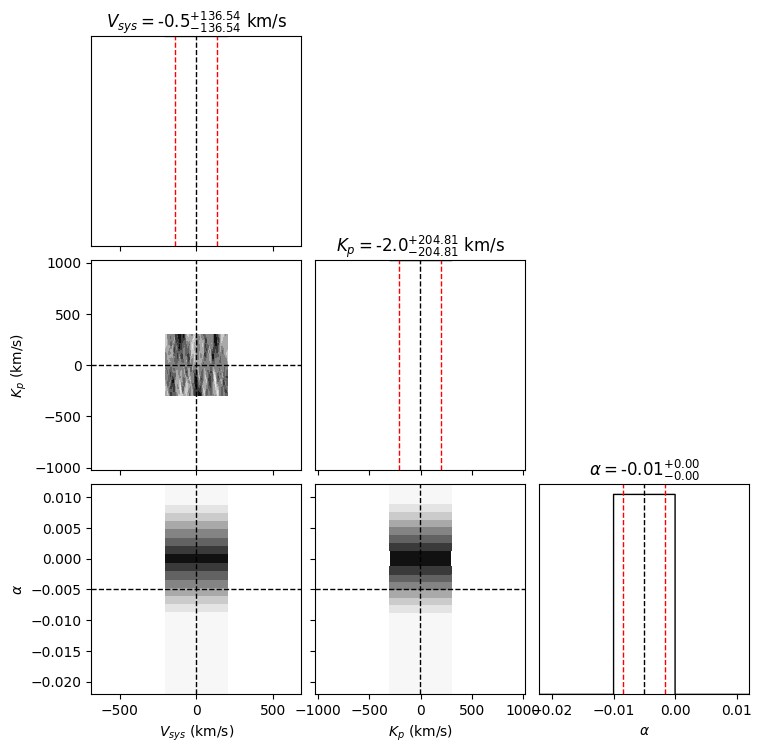

SYSREM 4

Max. peak from S/N map:
Kp = 164.0 km/s
Vsys = -16.0 km/s
S/N = -1.44

Max. peak from likelihood distribution:
Kp = 20.0 km/s
Vsys = -165.5 km/s
Significance = -1.46 (α = -0.01 ± {0.00,0.00})



<Figure size 640x480 with 0 Axes>

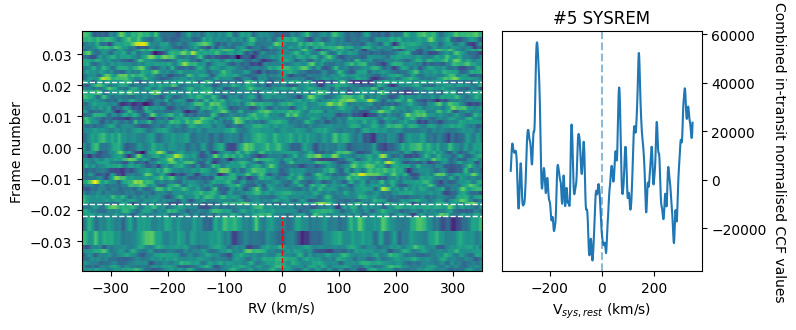

<Figure size 640x480 with 0 Axes>

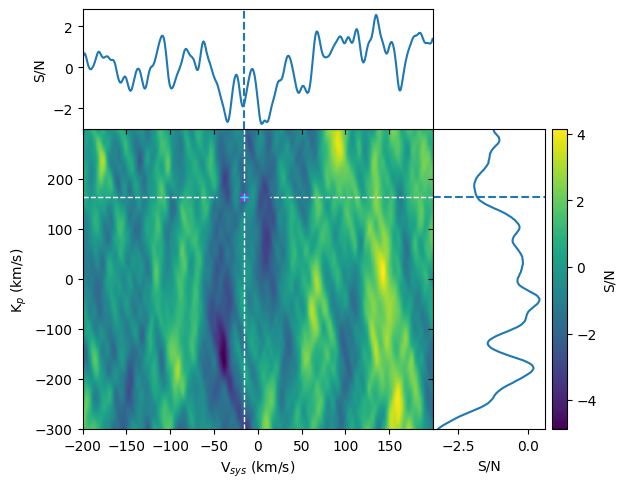

<Figure size 640x480 with 0 Axes>

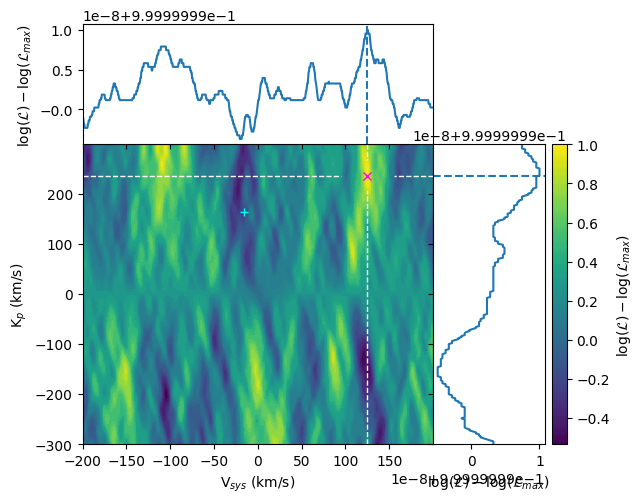

<Figure size 640x480 with 0 Axes>

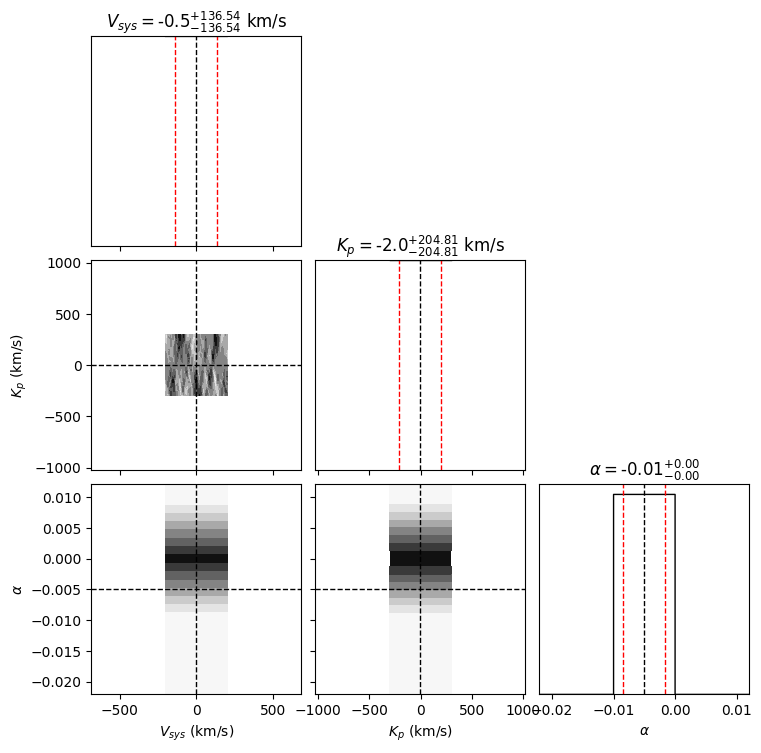

SYSREM 5

Max. peak from S/N map:
Kp = 164.0 km/s
Vsys = -16.0 km/s
S/N = -1.84

Max. peak from likelihood distribution:
Kp = 2.0 km/s
Vsys = -144.0 km/s
Significance = -1.46 (α = -0.01 ± {0.00,0.00})



<Figure size 640x480 with 0 Axes>

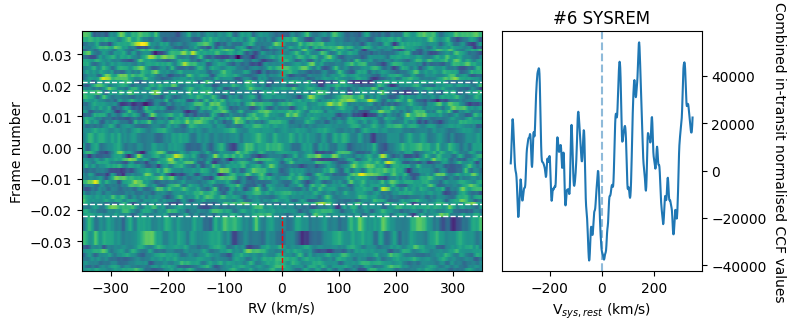

<Figure size 640x480 with 0 Axes>

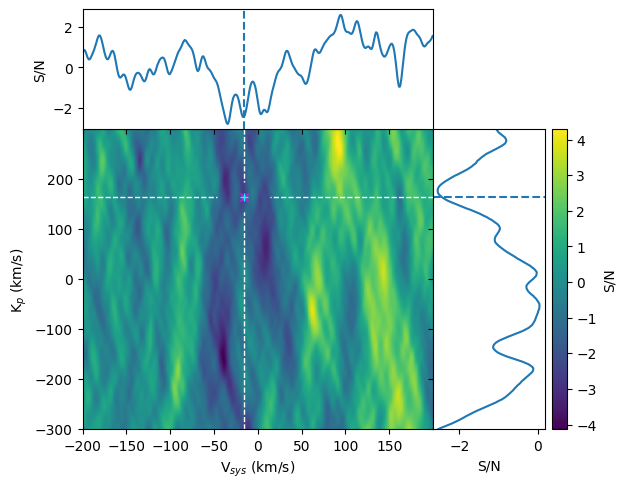

<Figure size 640x480 with 0 Axes>

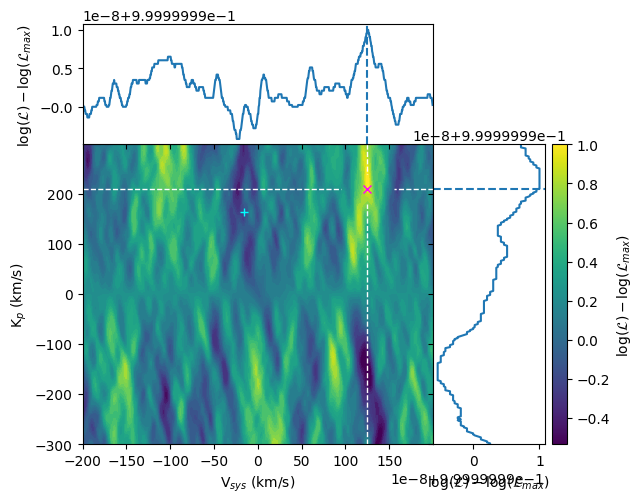

<Figure size 640x480 with 0 Axes>

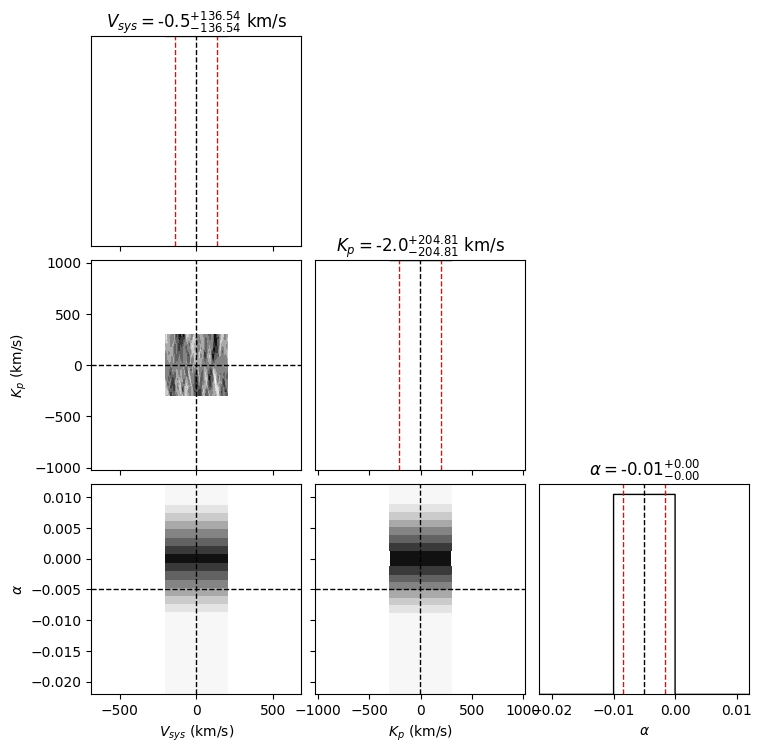

SYSREM 6

Max. peak from S/N map:
Kp = 164.0 km/s
Vsys = -16.0 km/s
S/N = -2.46

Max. peak from likelihood distribution:
Kp = 0.0 km/s
Vsys = -88.0 km/s
Significance = -1.46 (α = -0.01 ± {0.00,0.00})



<Figure size 640x480 with 0 Axes>

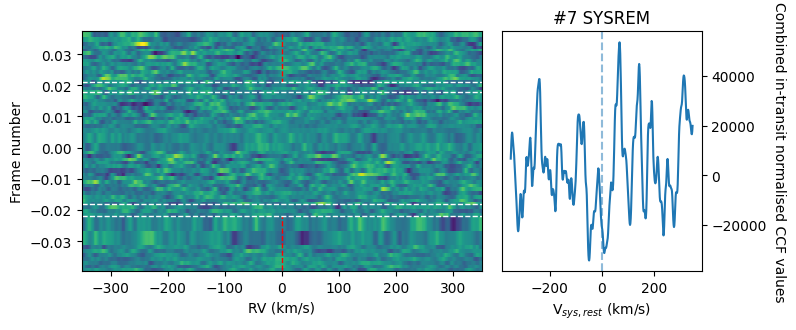

<Figure size 640x480 with 0 Axes>

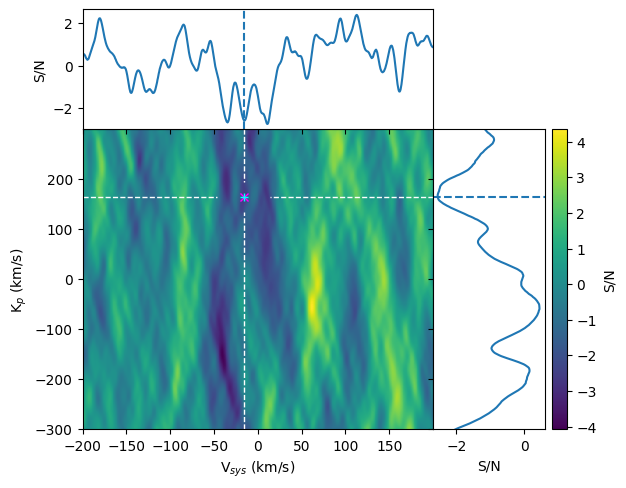

<Figure size 640x480 with 0 Axes>

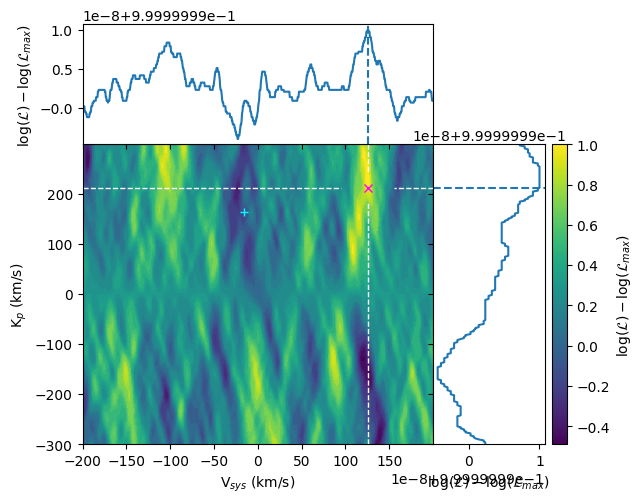

<Figure size 640x480 with 0 Axes>

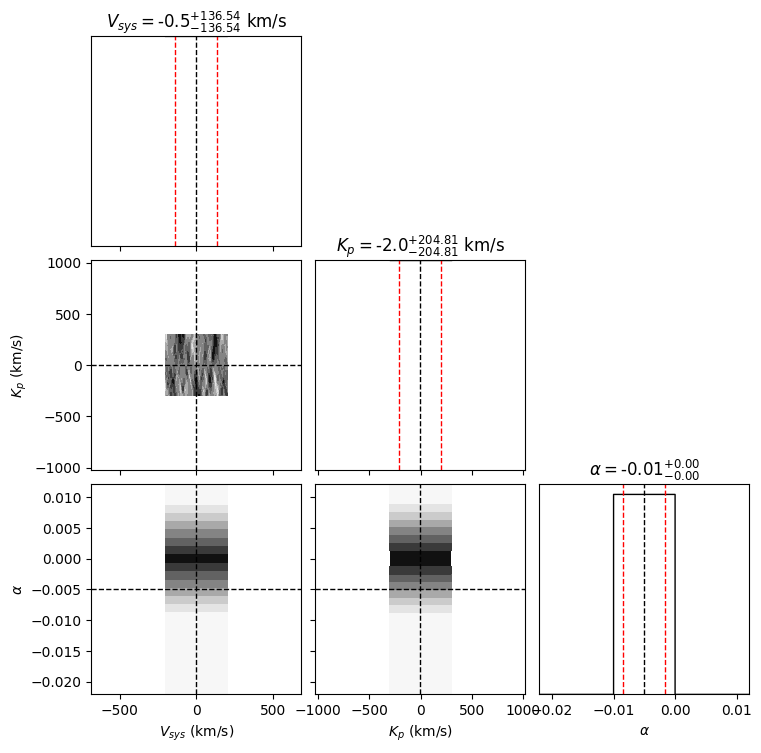

SYSREM 7

Max. peak from S/N map:
Kp = 164.0 km/s
Vsys = -16.0 km/s
S/N = -2.55

Max. peak from likelihood distribution:
Kp = 56.0 km/s
Vsys = -143.0 km/s
Significance = -1.46 (α = -0.01 ± {0.00,0.00})



<Figure size 640x480 with 0 Axes>

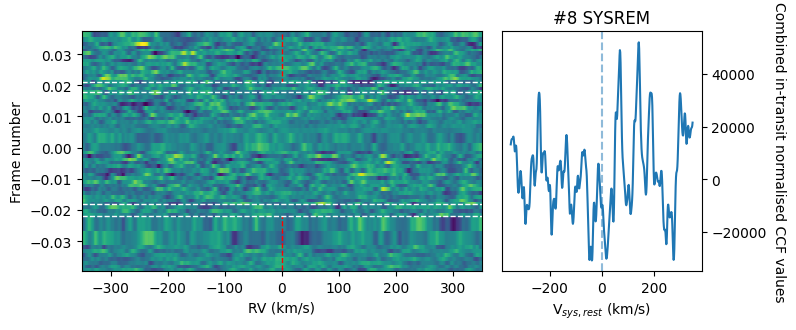

<Figure size 640x480 with 0 Axes>

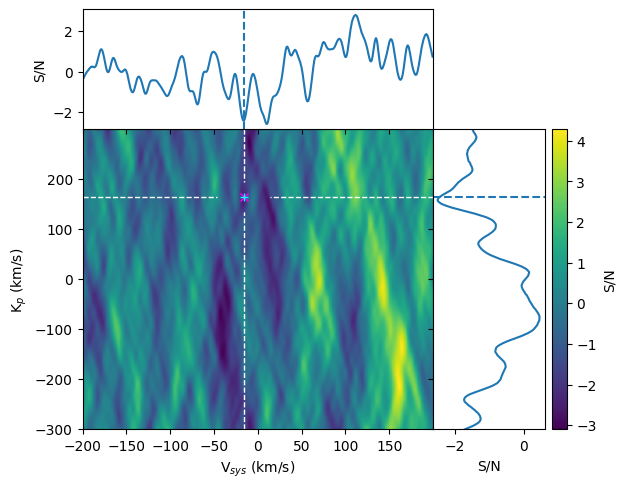

<Figure size 640x480 with 0 Axes>

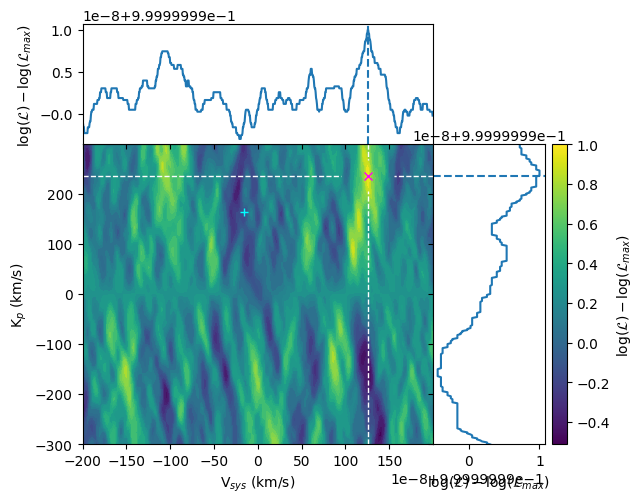

<Figure size 640x480 with 0 Axes>

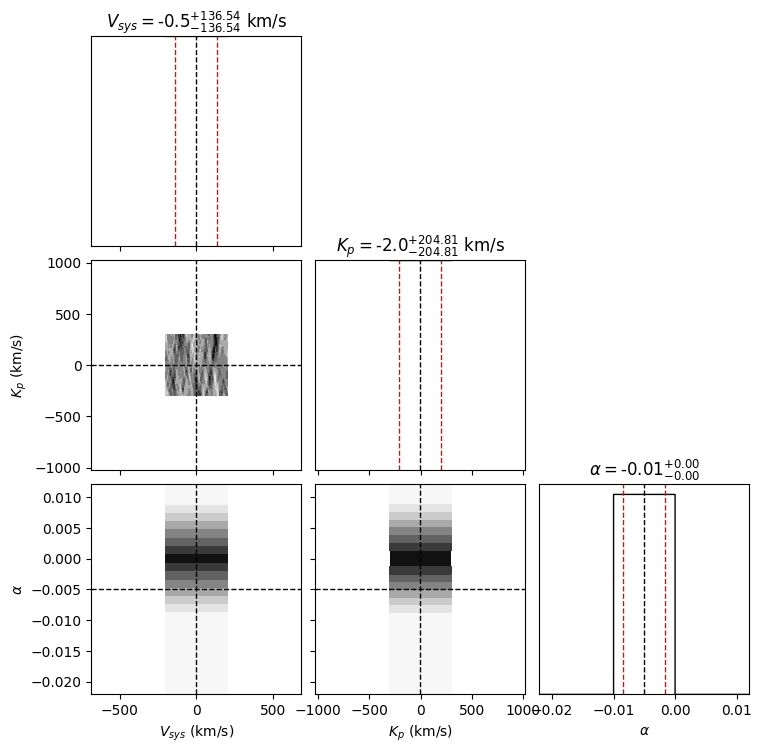

SYSREM 8

Max. peak from S/N map:
Kp = 164.0 km/s
Vsys = -16.0 km/s
S/N = -2.44

Max. peak from likelihood distribution:
Kp = -4.0 km/s
Vsys = -142.5 km/s
Significance = -1.46 (α = -0.01 ± {0.00,0.00})



<Figure size 640x480 with 0 Axes>

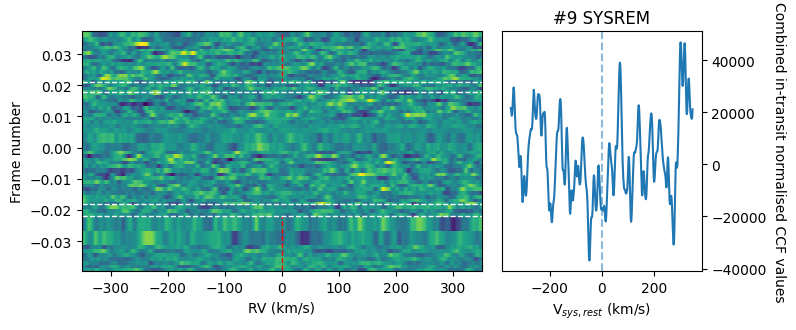

<Figure size 640x480 with 0 Axes>

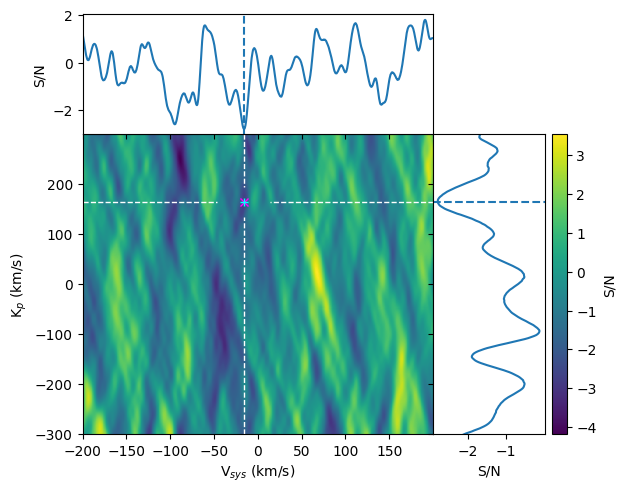

<Figure size 640x480 with 0 Axes>

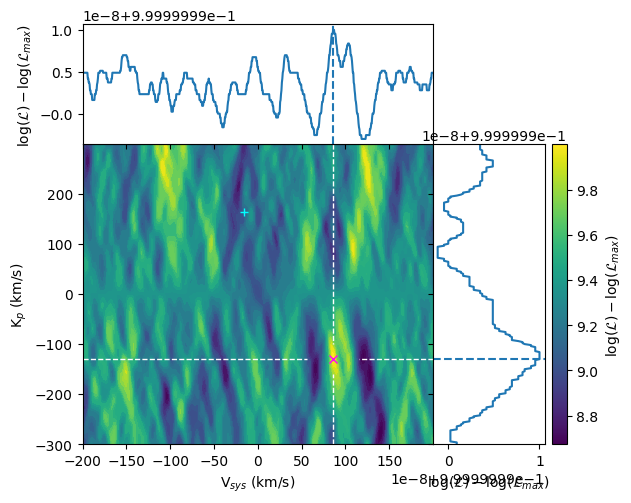

<Figure size 640x480 with 0 Axes>

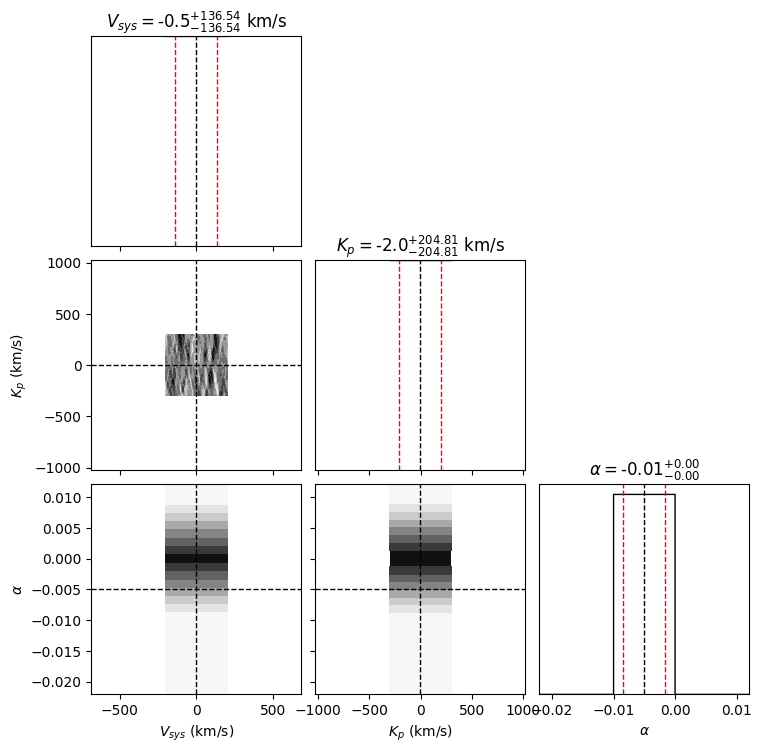

SYSREM 9

Max. peak from S/N map:
Kp = 164.0 km/s
Vsys = -16.0 km/s
S/N = -2.78

Max. peak from likelihood distribution:
Kp = 16.0 km/s
Vsys = -88.0 km/s
Significance = -1.46 (α = -0.01 ± {0.00,0.00})



<Figure size 640x480 with 0 Axes>

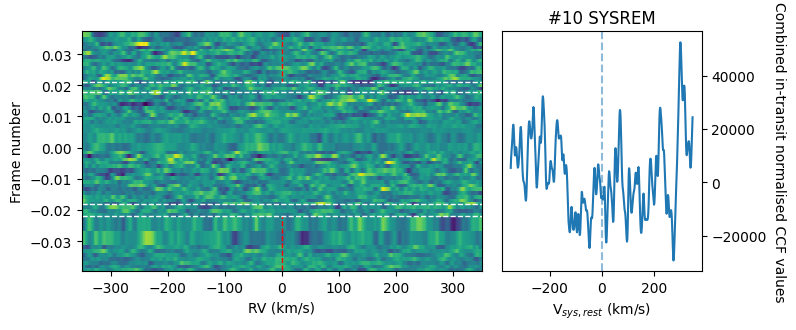

<Figure size 640x480 with 0 Axes>

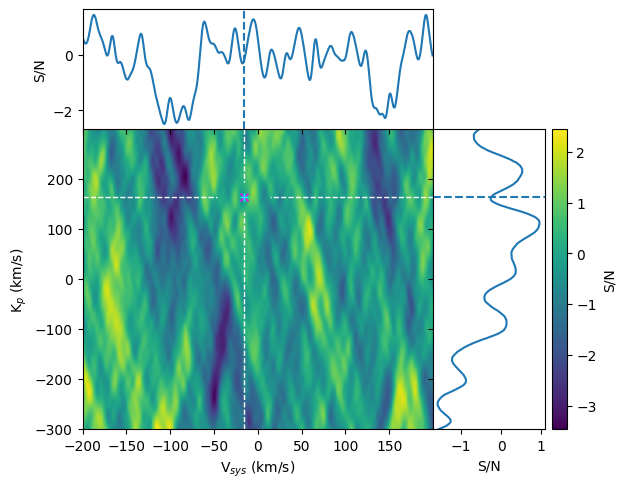

<Figure size 640x480 with 0 Axes>

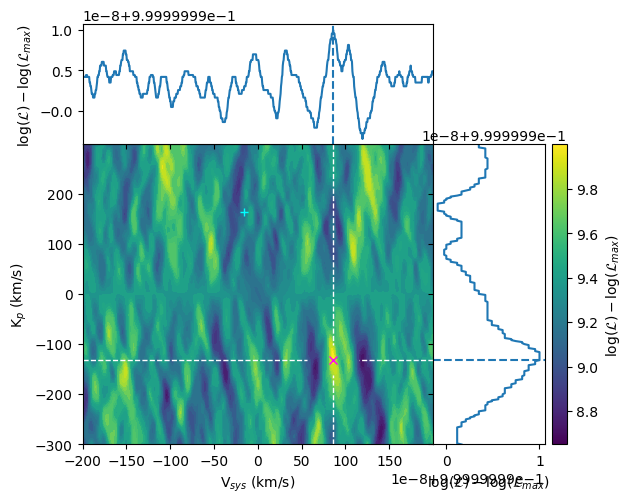

<Figure size 640x480 with 0 Axes>

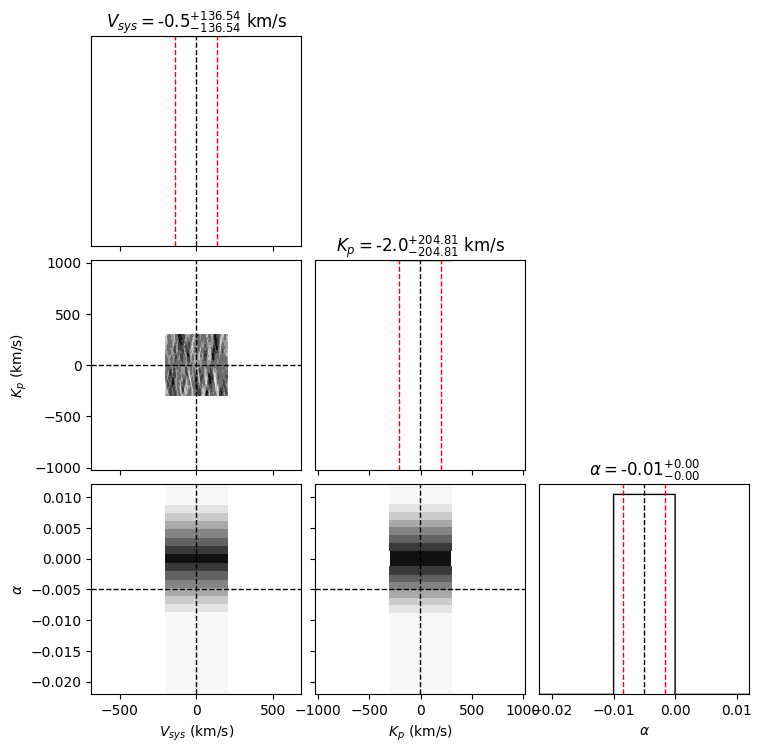

SYSREM 10

Max. peak from S/N map:
Kp = 164.0 km/s
Vsys = -16.0 km/s
S/N = -0.24

Max. peak from likelihood distribution:
Kp = -2.0 km/s
Vsys = -91.0 km/s
Significance = -1.46 (α = -0.01 ± {0.00,0.00})



<Figure size 640x480 with 0 Axes>

In [6]:
# evaluate at planetary rest-frame

sampling = 1.30
RV_sample = np.arange(-350,350,sampling)    # in km/s
Kp_sample = np.arange(-300,300,2.0)           # in km/s
Vsys_sample = np.arange(-200,200,0.5)       # in km/s
Kp_planet = 164.27                          # in km/s (calculated from formula given in Exoplanets (Seager, 2010))
Vsys_planet = -17.91 + 2.0                        # in km/s (calculated from stellar RV analysis)
A_sample = np.arange(-5.,5.,0.01)
sys_num = 10

wvdat,fluxdat,errdat = wave_data,flux_data,error_data 

cctotal, snmap_pnet = detect_molecules(wvdat,fluxdat,errdat,modwave_tel,modflux_tel,sys_num+1,carm_order,
                RV_sample,Kp_sample,Vsys_sample,A_sample,
                Kp_planet,Vsys_planet,out_transit_mask,rvcor,phase,std_brogi=False,plot=True)

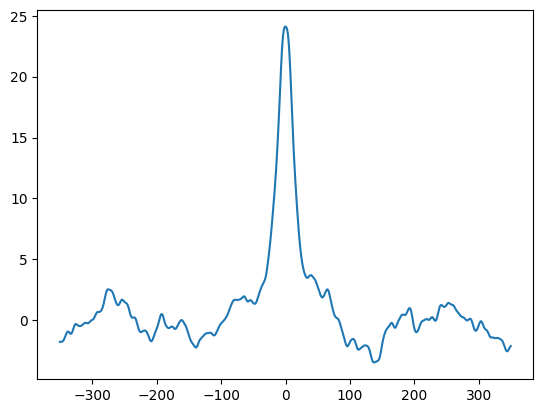

In [65]:
def find_nearest(array, value):
    return (np.abs(np.asarray(array) - value)).argmin()

min_lim = find_nearest(RV_sample,-100)
max_lim = find_nearest(RV_sample,100)
cctotal_nan = cctotal[0].copy()
cctotal_nan[:,min_lim:max_lim] = np.NaN
#np.nanstd(cctotal_nan)
plt.plot(RV_sample,cctotal[0][0]/np.nanstd(cctotal_nan))


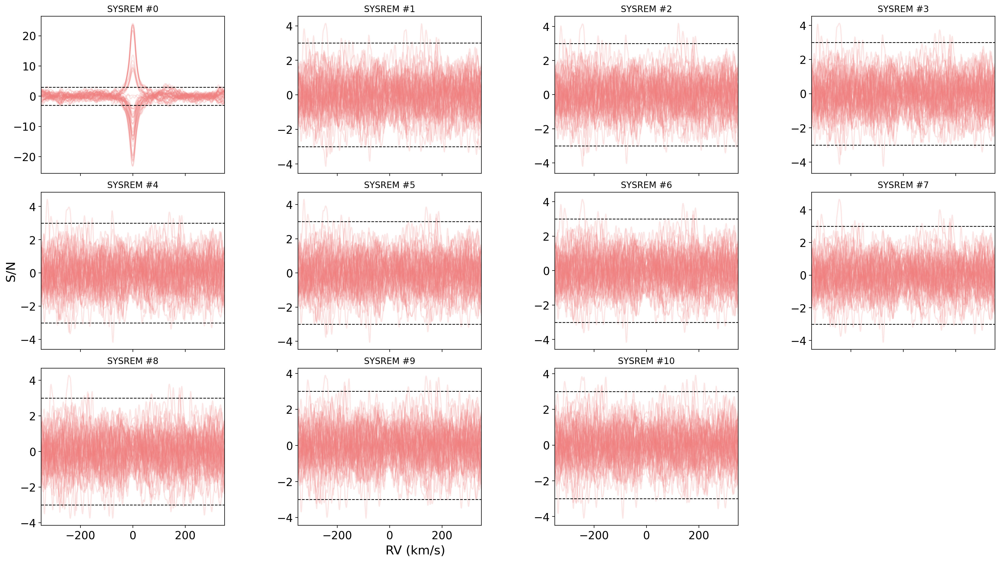

<Figure size 640x480 with 0 Axes>

In [90]:
# iter = np.array([[0,1],[2,3],[4,5],[6,7],[8,9],[10]])
iter = np.array([[0,1,2,3],[4,5,6,7],[8,9,10,11]])

fig = plt.figure(figsize=(7, 6),dpi=200)
lbl = 17
fig.supxlabel("RV (km/s)",y=-(0.52+0.52+0.18),x=1.02,fontsize=lbl)
k1 = 0
for i in range(len(iter)):
    k2 = 0
    for idx,j in enumerate(iter[i]):
        if i==len(iter)-1 and j==11:
            pass
        else:
            axes_kpvsysmap = [0+k2, 0-k1, 0.5, 0.5]
            kpvsysmap = plt.axes(axes_kpvsysmap)

            cctotal_nan = cctotal[j].copy()
            cctotal_nan[:,min_lim:max_lim] = np.NaN
            for k in range(len(cctotal[j])):
                kpvsysmap.plot(RV_sample,cctotal[j][k]/np.nanstd(cctotal_nan),c='lightcoral',alpha=0.2)
            
            # kpvsysmap.plot(RV_sample,np.sum(cctotal[j],axis=0),c='lightcoral',alpha=1)

            kpvsysmap.set_title('SYSREM #'+str(j))

            # if idx == 1 or idx == 2 or idx == 3:
            #     kpvsysmap.set_yticklabels([])
            k2+=0.7
            if i != len(iter)-1:
                kpvsysmap.set_xticklabels([])
            if i == 1 and idx == 0:
                # kpvsysmap.set_xlabel("$V_\mathrm{rest}$ (km s$^{-1}$)",y=-(0.52+0.52+0.52),fontsize=lbl)
                kpvsysmap.set_ylabel("S/N",fontsize=lbl)

            # kpvsysmap.set_ylim(-10,10)
            kpvsysmap.set_xlim(-350,350)
            kpvsysmap.tick_params(axis='both', which='major', labelsize=15)
            kpvsysmap.axhline(y=-3,ls='--',c='black',lw=1)
            kpvsysmap.axhline(y=3,ls='--',c='black',lw=1)

    k1+=0.56

plt.savefig("figures/h2opokaz_snmap.pdf",format="pdf",dpi=200,bbox_inches="tight",pad_inches=0.1)
plt.show(block=False)
plt.clf()

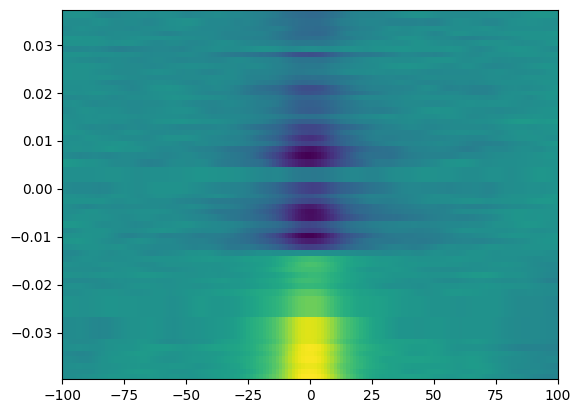

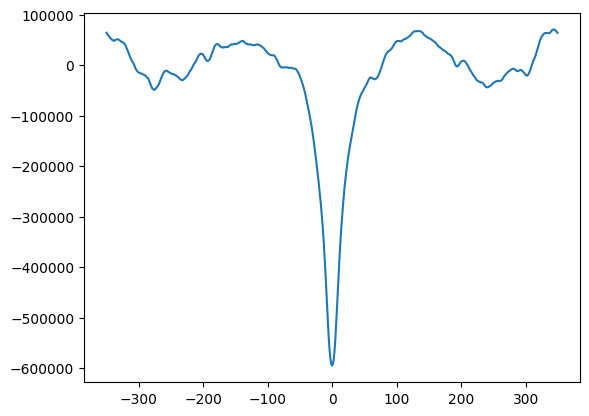

In [31]:
plt.pcolormesh(RV_sample,rel_phase,cctotal[0])
plt.xlim(-100,100)
plt.show()
plt.plot(RV_sample,np.sum(cctotal[0],axis=0))

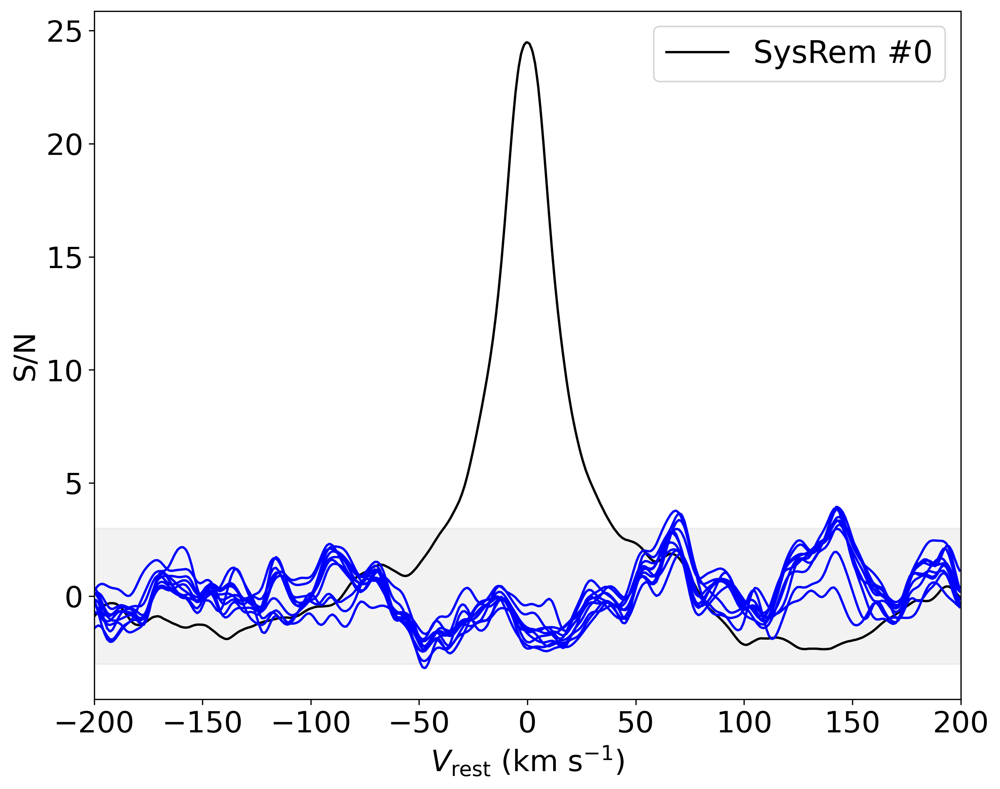

<Figure size 640x480 with 0 Axes>

In [16]:
# this is evaluated at the Kp = 0 slice; 
# please change to kmax = (np.abs(Kp_sample - 164.27)).argmin() if plot in paper want to be repreoduced

kmax = (np.abs(Kp_sample - 0)).argmin()
lbl = 19
fig = plt.figure(figsize=(10,8),dpi=300)
for i in range(len(snmap_pnet)):
    if i==0:
        plt.plot(Vsys_sample,snmap_pnet[i][kmax, :],label='SysRem #'+str(i),c='black')
        plt.legend(fontsize=20)
    else:
        plt.plot(Vsys_sample,snmap_pnet[i][kmax, :],label='SysRem #'+str(i),c='blue')
    plt.xlabel(r'$V_\mathrm{rest}$ (km s$^{-1}$)',fontsize=lbl)
    plt.ylabel('S/N',fontsize=lbl)
    # plt.axhline(y=3, ls='--')
    # plt.axhline(y=-3, ls='--')
    # plt.ylim([min(Kp_sample), max(Kp_sample)])
    plt.tick_params(axis='both', which='major', labelsize=lbl)

# plt.legend(loc='lower left',prop={'size': 12})
plt.xlim(-200,200)
plt.fill_between(Vsys_sample, -3,3, color='gray',alpha=0.1)
plt.savefig("figures/telluric_CCF.pdf",format="pdf",dpi=200,bbox_inches="tight",pad_inches=0.1)
plt.show(block=False)
plt.clf()